Importa as bibliotecas

In [3]:
import LattesLab as ll
from minisom import MiniSom
import matplotlib.pyplot as plt
import numpy as np

Armazena o diretorio

In [4]:
folder = "D:\\thiag\\Documents\\INPE\\Research\\Datasets\\PIBIC"

Obtem o dataframe maior

In [5]:
lattesframe = ll.get_dataframe_from_folders(folder, True)

Obtem o dataframe de publicações

In [6]:
pubdata = ll.get_pub_year_data(lattesframe)

Reseta o dataframe para que o primeiro ano seja o ano do primeiro pibic.

In [7]:
ll.first_nonzero(pubdata, lattesframe['anoPrimeiroPIBIC'], 2)

Converte o dataframe para uma matriz float.

In [8]:
Data = pubdata.values.astype(float)

Define e treina a SOM

C:\Users\thiag\Anaconda3\lib\site-packages\ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide


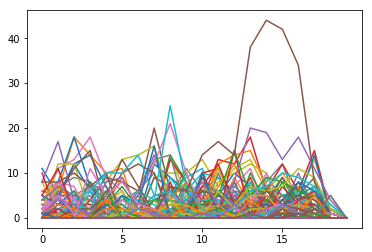

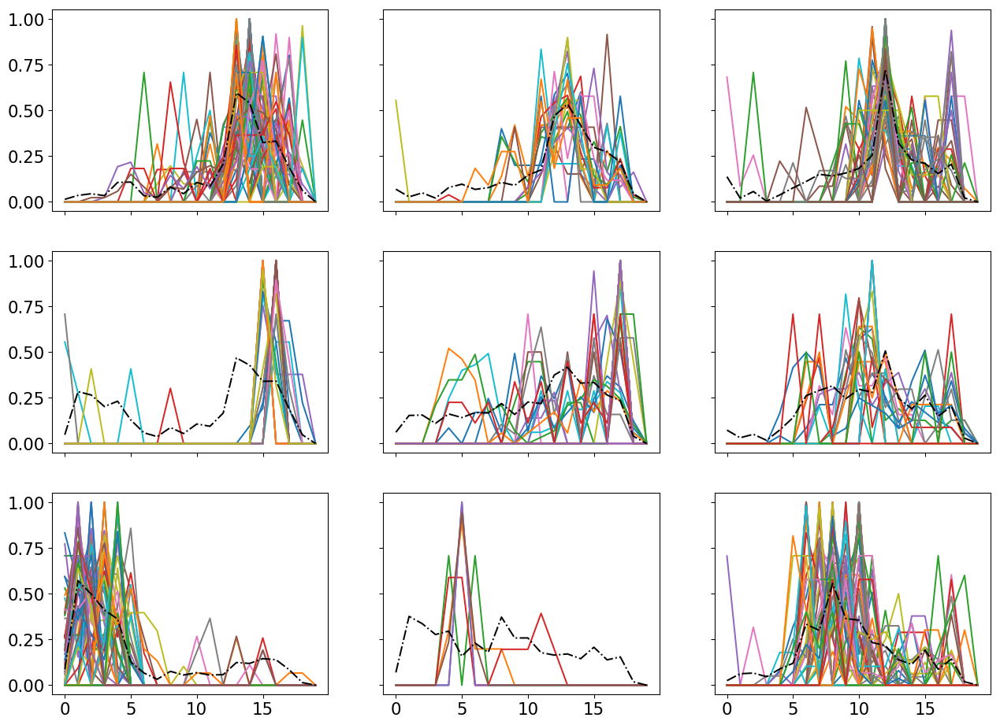

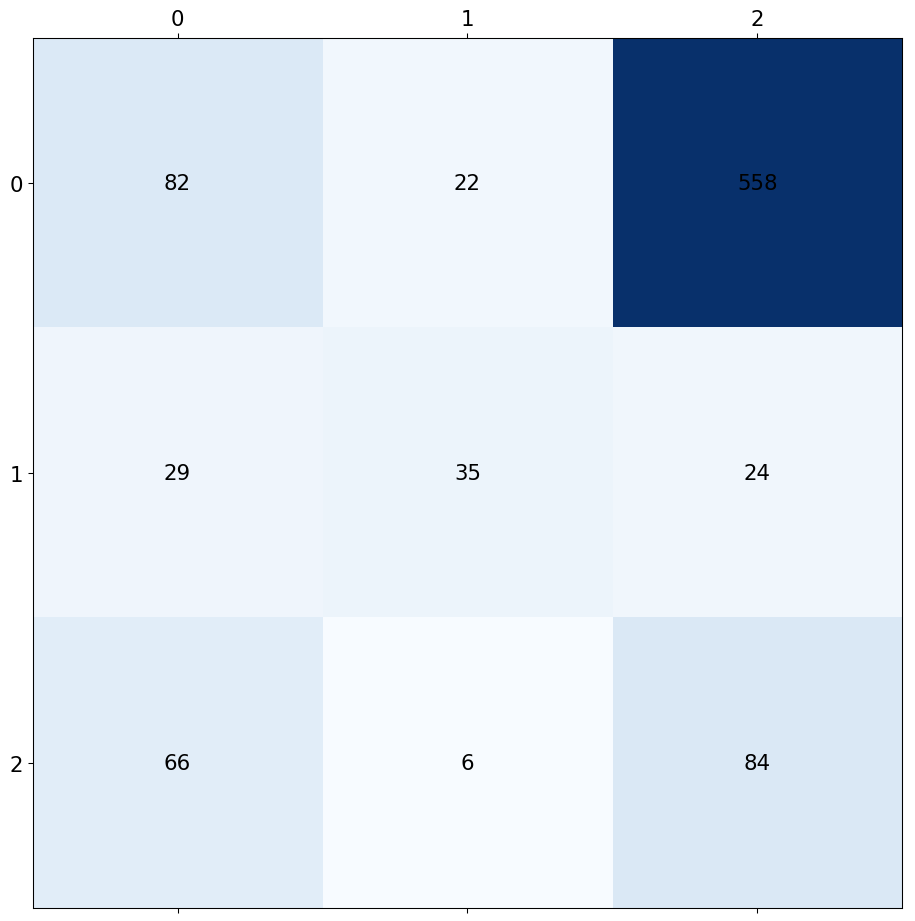

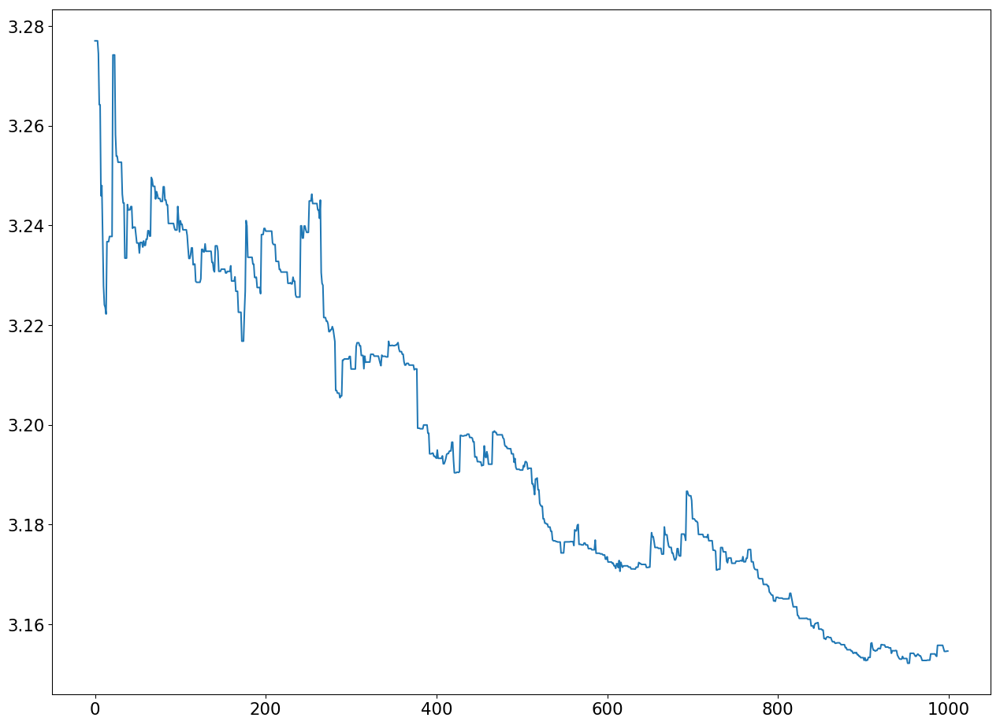

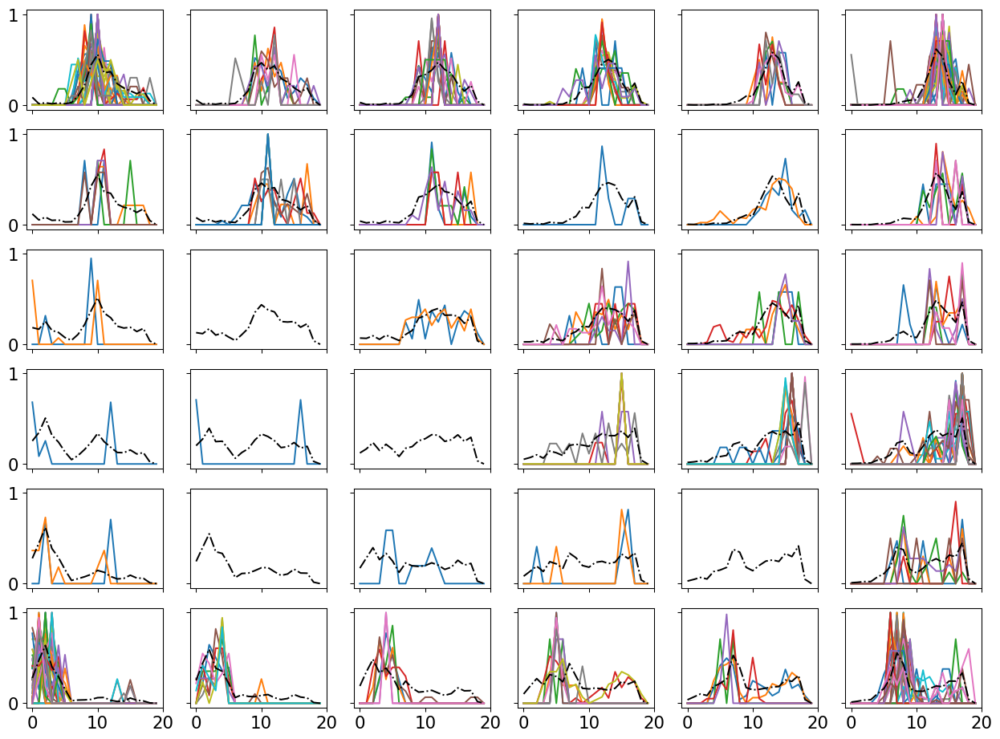

...

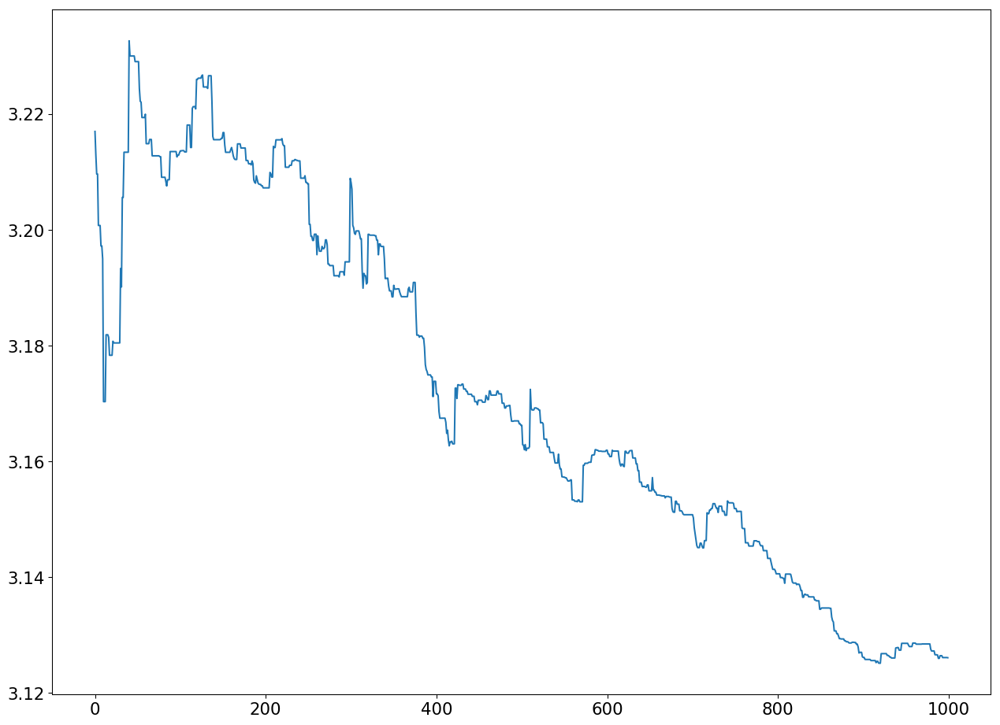

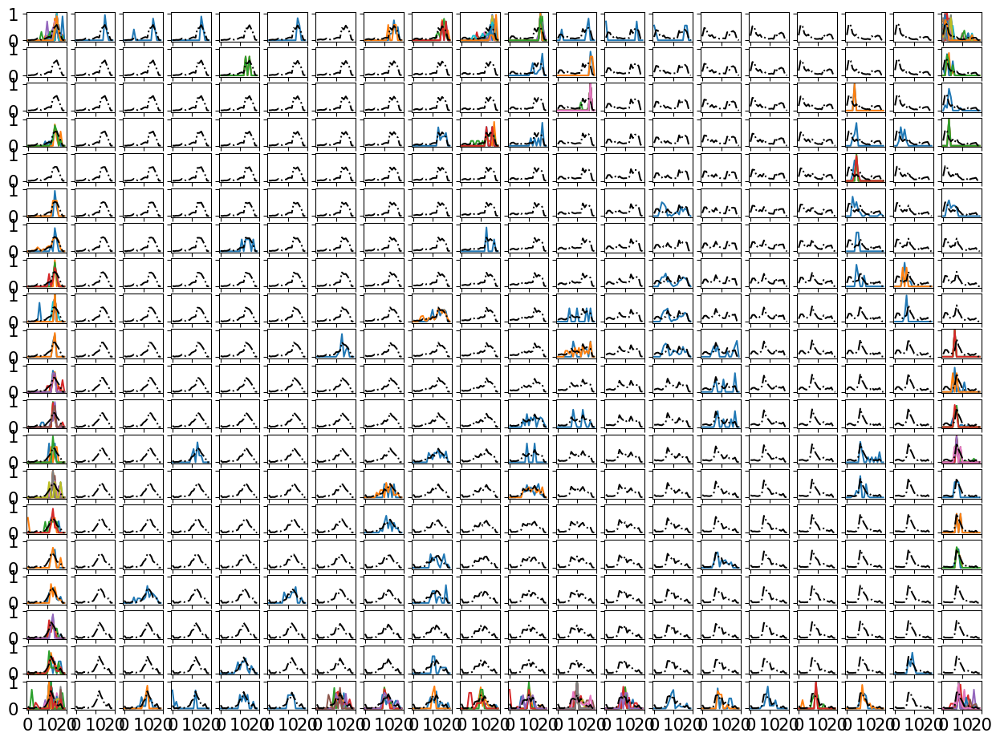

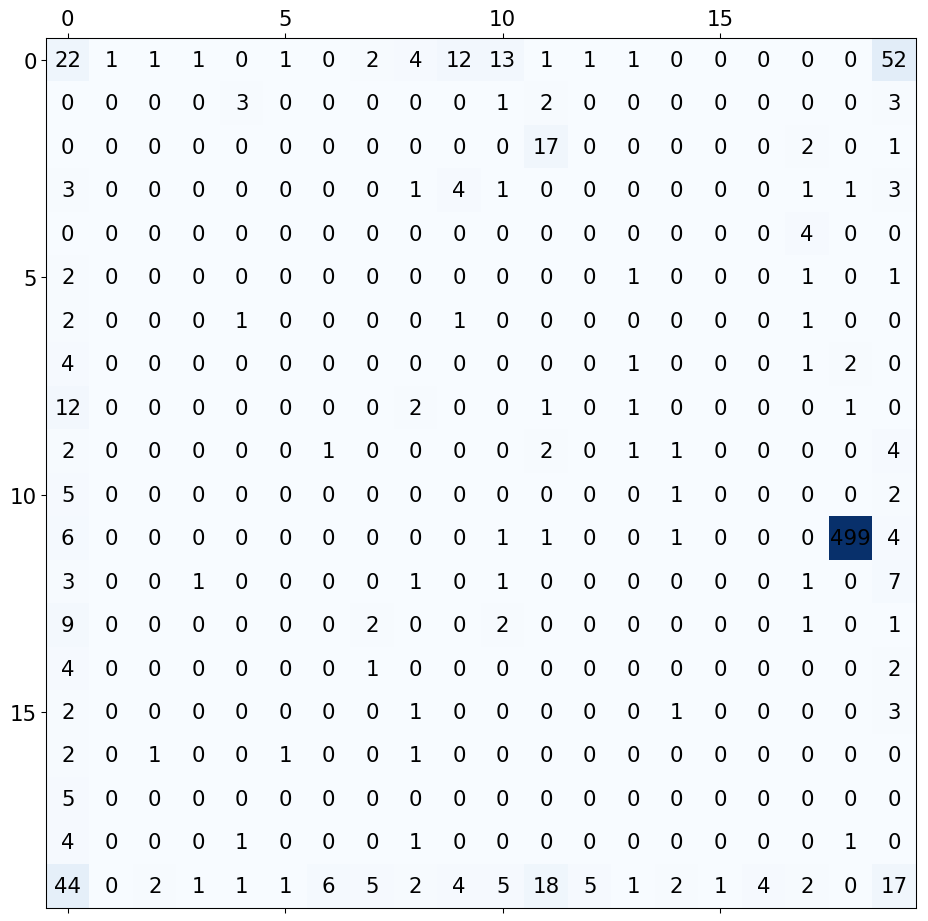

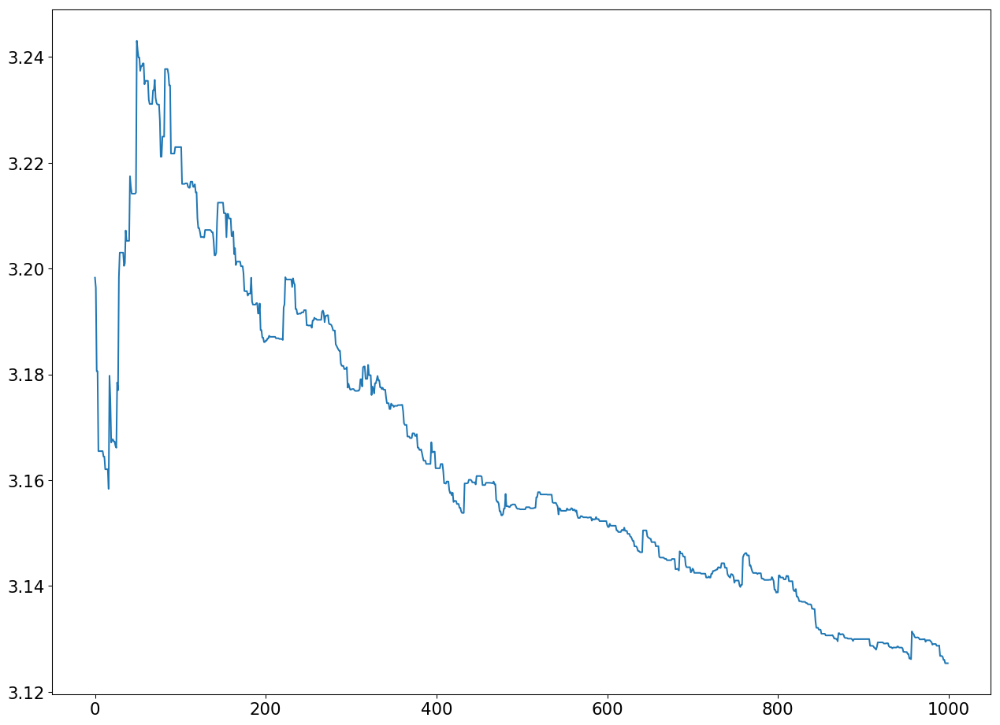

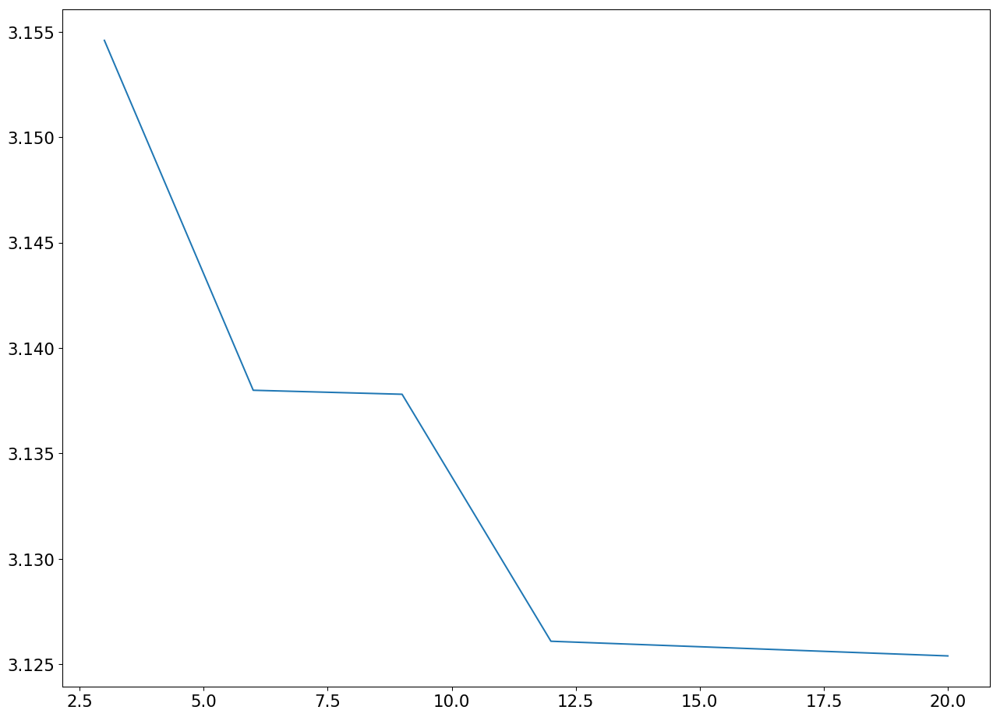

In [7]:
Data2 = [i for i in Data if i.tolist() != np.zeros(20).tolist()]

Data2 = np.array(Data2, dtype=float)

sizes = [3, 6, 9, 12, 20]

somlist = []
errlist = []
erriter = []

epochs = 1000

[plt.plot(k) for k in Data]

for sizei in sizes:
    
    somsizex = sizei
    somsizey = sizei
    
    sigmai= sizei/2.1
    
    som = MiniSom(somsizex, somsizey, 20, sigma=sigmai, learning_rate=0.05) # initialization of SOM
    
#    for i in range(0, epochs):
    som.train_random(Data, epochs) # trains the SOM with 1000 iterations
    
#    [plt.plot(som.winner(i)[0], som.winner(i)[1],'.') for i in Data]
    
    xyz = som.quantization(Data)
    
    abc = som.win_map(Data)
    
    err = som.quantization_error(Data)
    
    erriter.append(som.err_evol)
    somlist.append(som)
    errlist.append(err)
    
    from pylab import rcParams
    rcParams['figure.figsize'] = 16, 12
    rcParams['figure.dpi'] = 96
    rcParams['font.size'] = 16
    
    fig, axs = plt.subplots(somsizex, somsizey, sharex=True, sharey=True)
    
    for i in range(somsizex):
        for j in range(somsizey):
            [axs[i, j].plot(k/np.linalg.norm(k)) for k in abc[i, j]]
#            [axs[i, j].plot(k) for k in abc[i, j]]
    #        axs[i][j].axis('off')
            axs[i, j].plot(som.get_weights()[i][j], 'k', linestyle='-.')
    plt.show()

#Plot the quantity of points associated with a neuron    
    x = np.zeros((somsizex, somsizey))

    for i in range(somsizex):
        for j in range(somsizey):
            x[i,j]=len(abc[i,j])
    
    fig, ax = plt.subplots()
    
    ax.matshow(x, cmap=plt.cm.Blues)
    
    for i in range(somsizex):
        for j in range(somsizey):
            c = int(x[j,i])
            ax.text(i, j, str(c), va='center', ha='center')
    plt.show()
    
    plt.plot(som.err_evol)

plt.figure()
plt.plot(sizes, errlist)

10000 epochs

C:\Users\thiag\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide


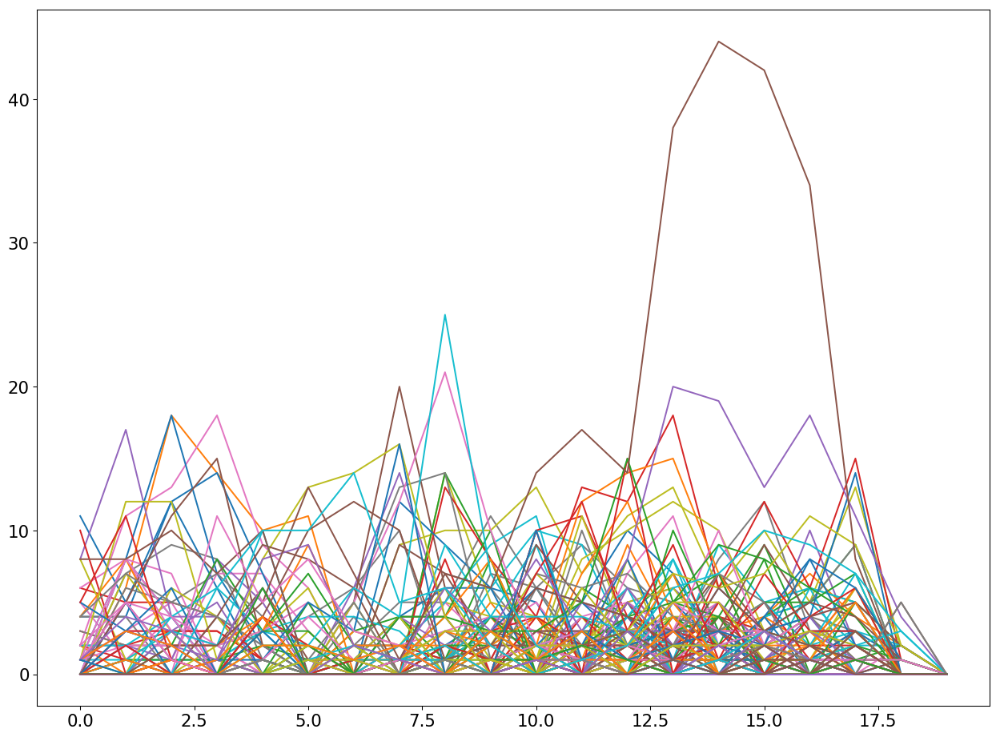

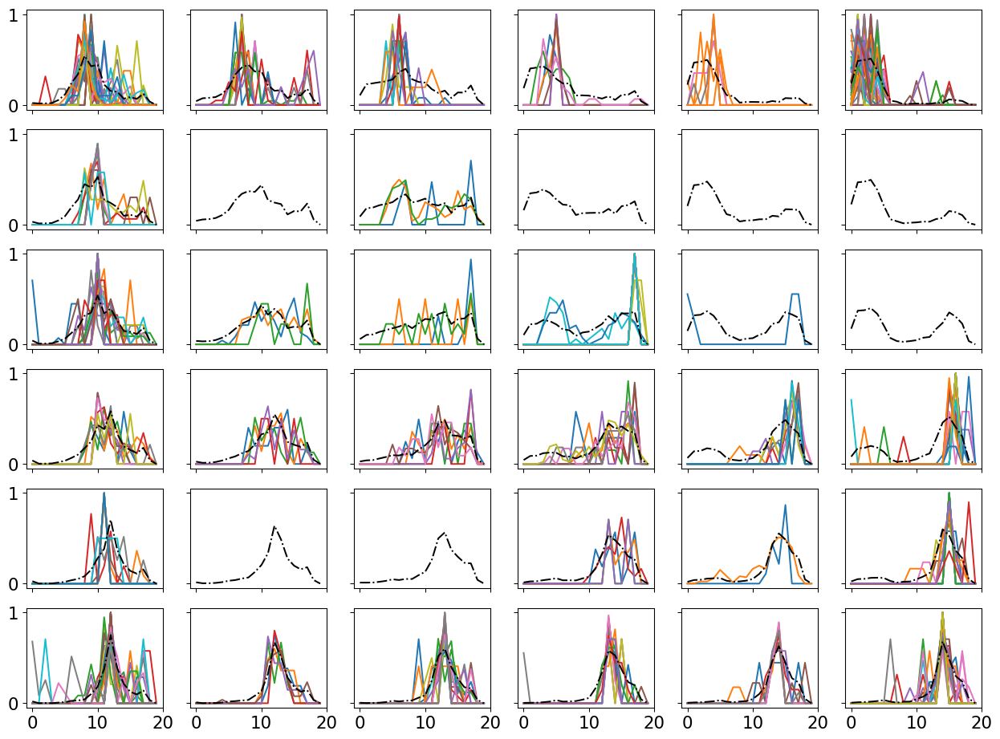

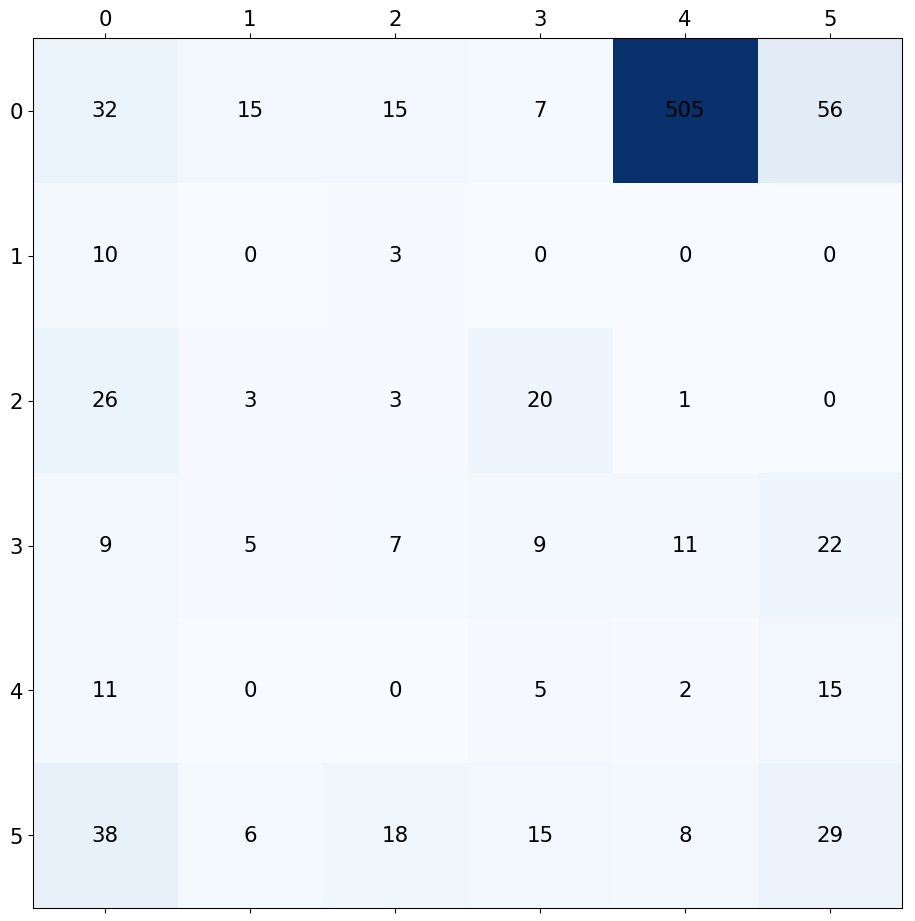

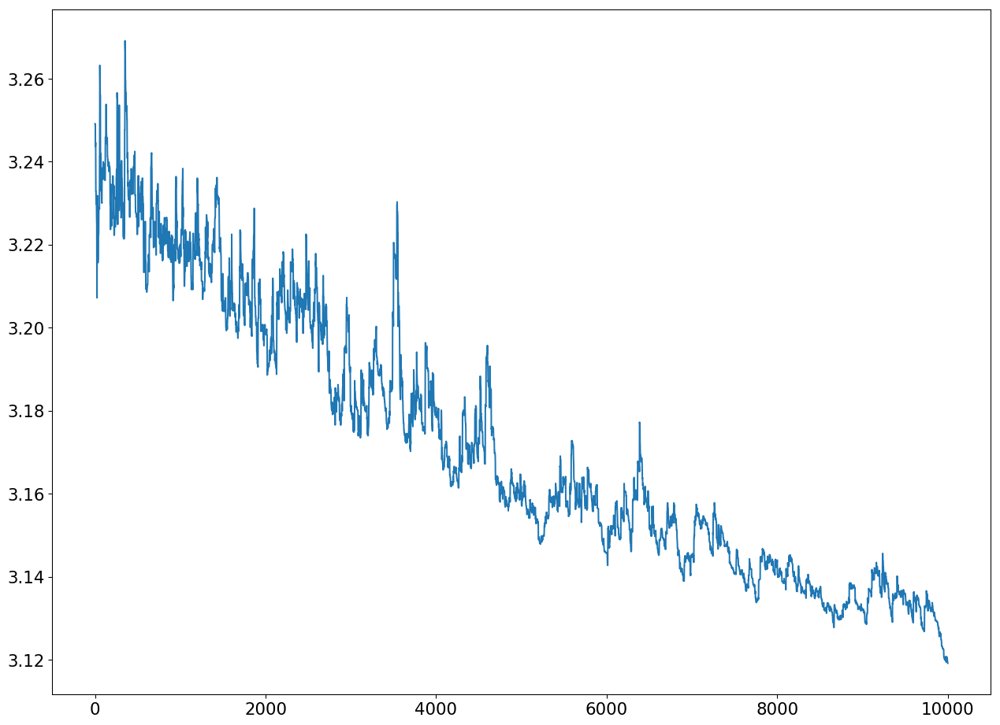

In [8]:
sizes2 = [6]

somlist2 = []
errlist2 = []
erriter2 = []

epochs = 10000

[plt.plot(k) for k in Data]

for sizei in sizes2:
    
    somsizex = sizei
    somsizey = sizei
    
    sigmai= sizei/2.1
    
    som = MiniSom(somsizex, somsizey, 20, sigma=sigmai, learning_rate=0.05) # initialization of SOM
    
#    for i in range(0, epochs):
    som.train_random(Data, epochs) # trains the SOM with 1000 iterations
    
#    [plt.plot(som.winner(i)[0], som.winner(i)[1],'.') for i in Data]
    
    xyz = som.quantization(Data)
    
    abc = som.win_map(Data)
    
    err = som.quantization_error(Data)
    
    erriter2.append(som.err_evol)
    somlist2.append(som)
    errlist2.append(err)
    
    from pylab import rcParams
    rcParams['figure.figsize'] = 16, 12
    rcParams['figure.dpi'] = 96
    rcParams['font.size'] = 16
    
    fig, axs = plt.subplots(somsizex, somsizey, sharex=True, sharey=True)
    
    for i in range(somsizex):
        for j in range(somsizey):
            [axs[i, j].plot(k/np.linalg.norm(k)) for k in abc[i, j]]
#            [axs[i, j].plot(k) for k in abc[i, j]]
    #        axs[i][j].axis('off')
            axs[i, j].plot(som.get_weights()[i][j], 'k', linestyle='-.')
    plt.show()
    
#Plot the quantity of points associated with a neuron    
    x = np.zeros((somsizex, somsizey))

    for i in range(somsizex):
        for j in range(somsizey):
            x[i,j]=len(abc[i,j])
    
    fig, ax = plt.subplots()
    
    ax.matshow(x, cmap=plt.cm.Blues)
    
    for i in range(somsizex):
        for j in range(somsizey):
            c = int(x[j,i])
            ax.text(i, j, str(c), va='center', ha='center')
    plt.show()
                
    plt.plot(som.err_evol)

Sigma = size/2 vs Sigma = size/4

C:\Users\thiag\Anaconda3\lib\site-packages\minisom.py:70: UserWarning: Warning: sigma is too high for the dimension of the map.
  warn('Warning: sigma is too high for the dimension of the map.')
C:\Users\thiag\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in true_divide


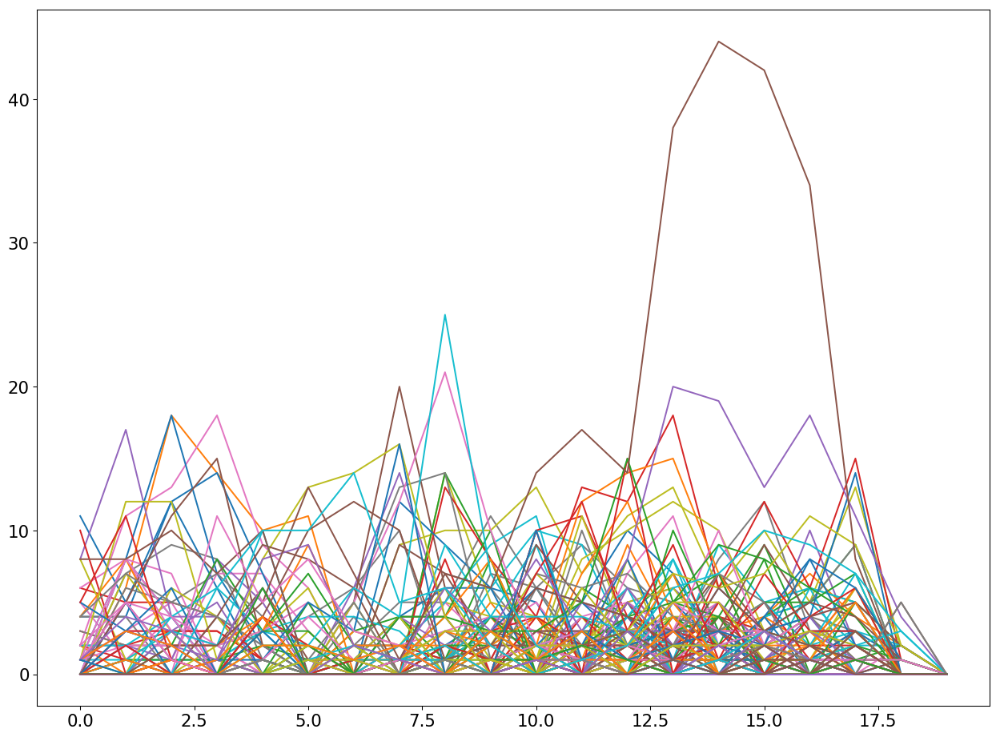

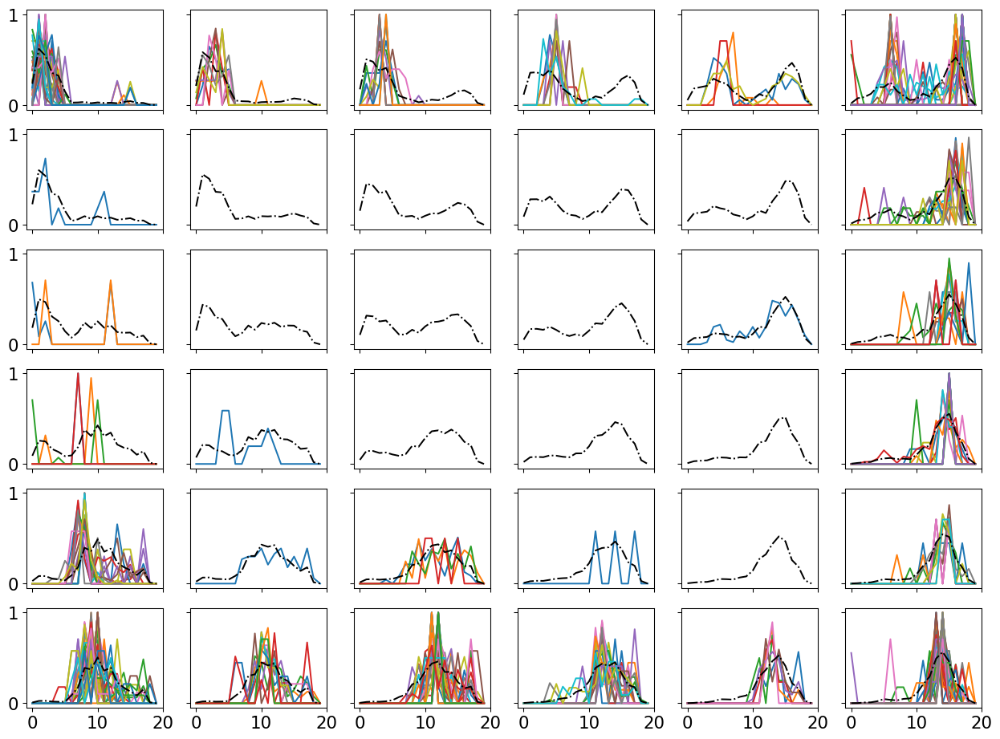

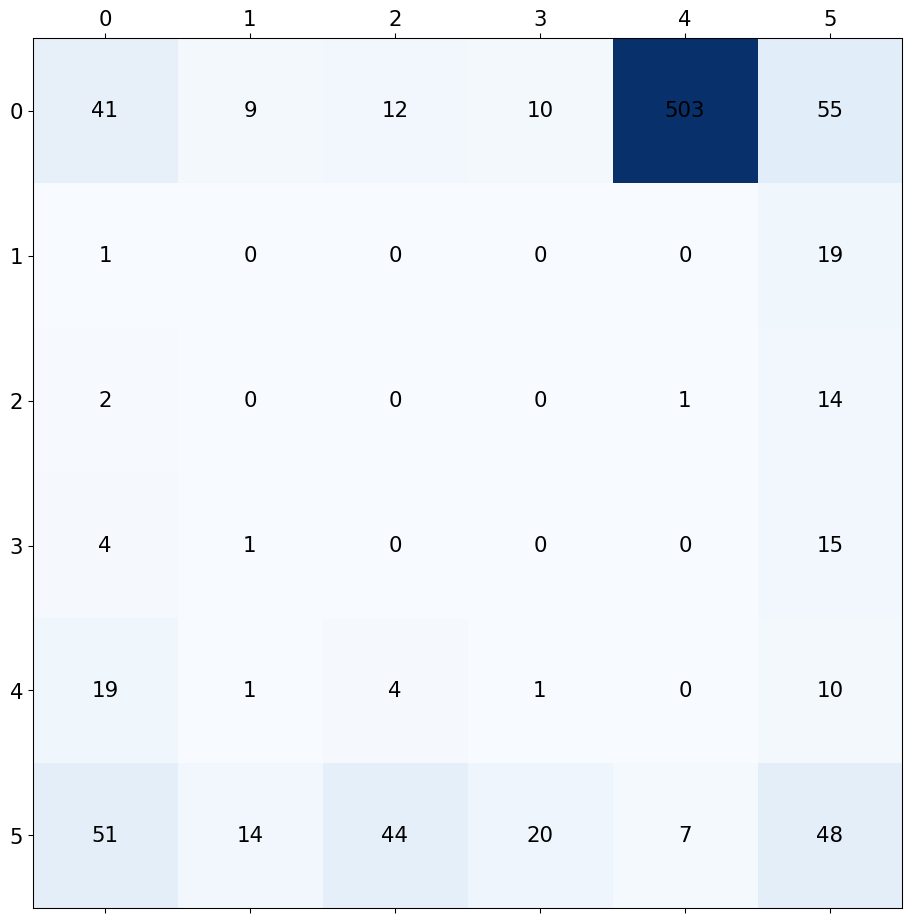

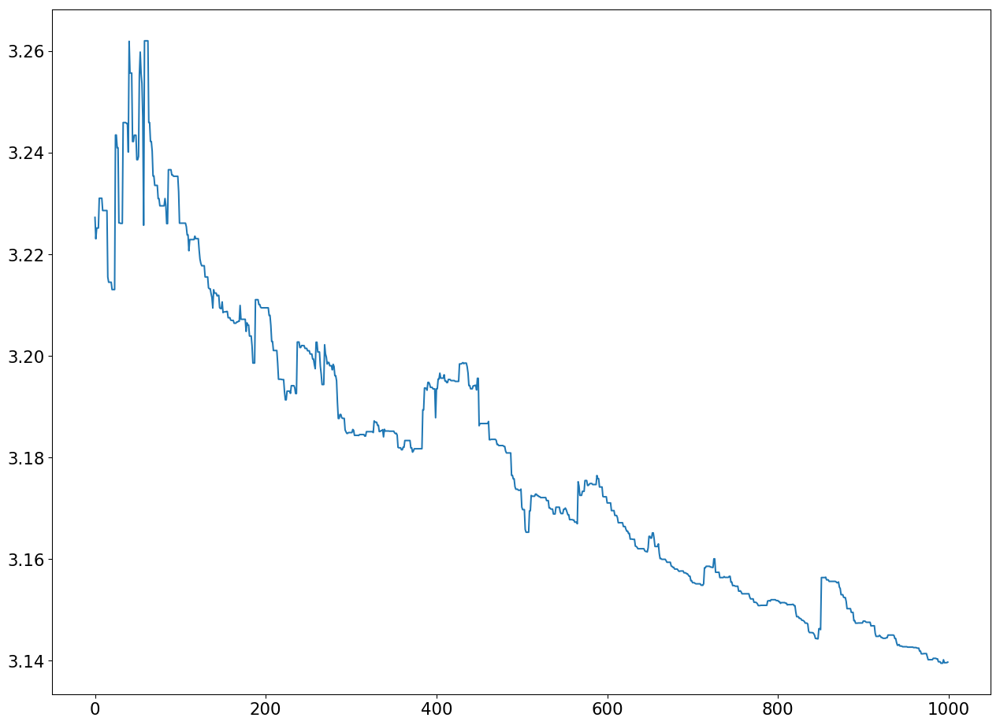

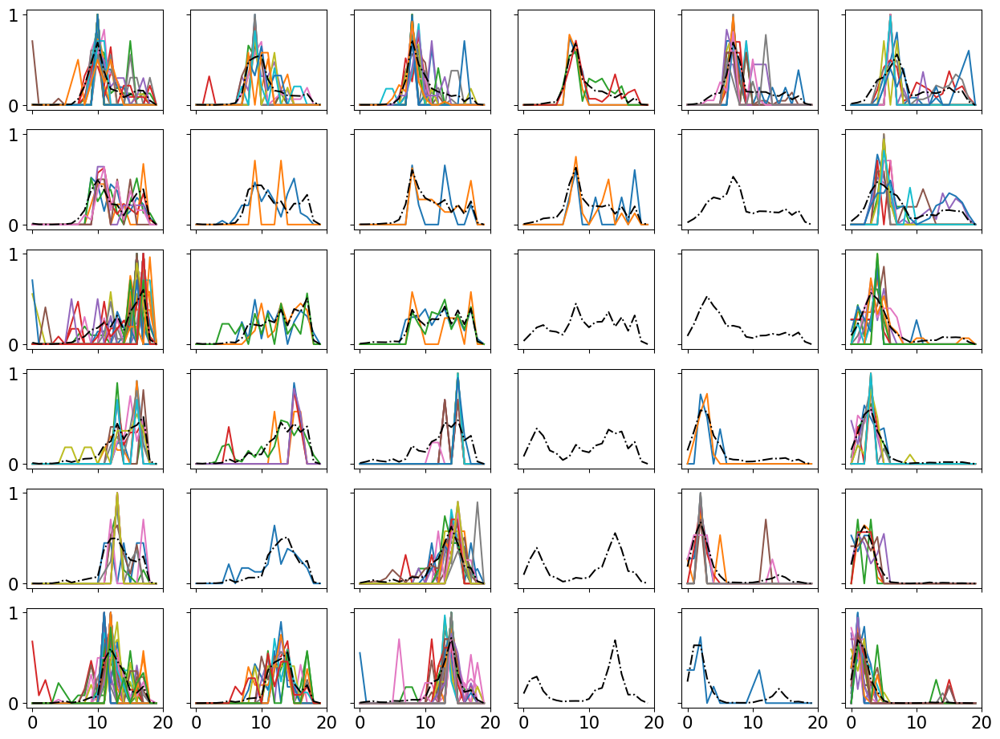

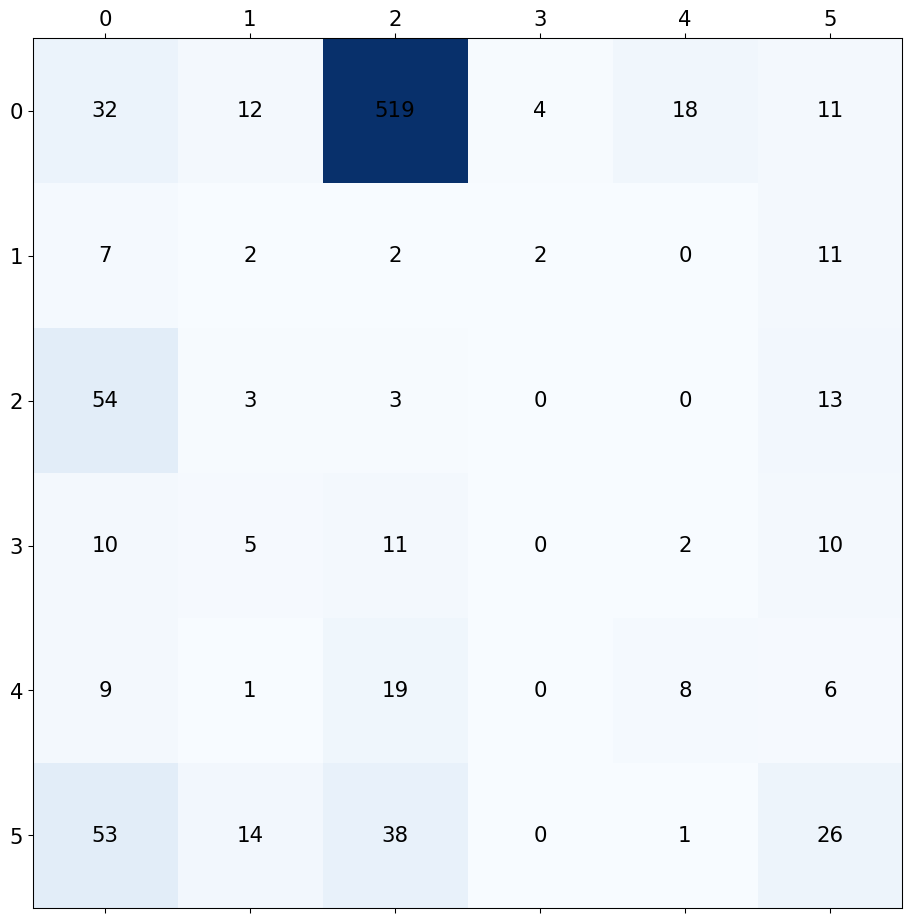

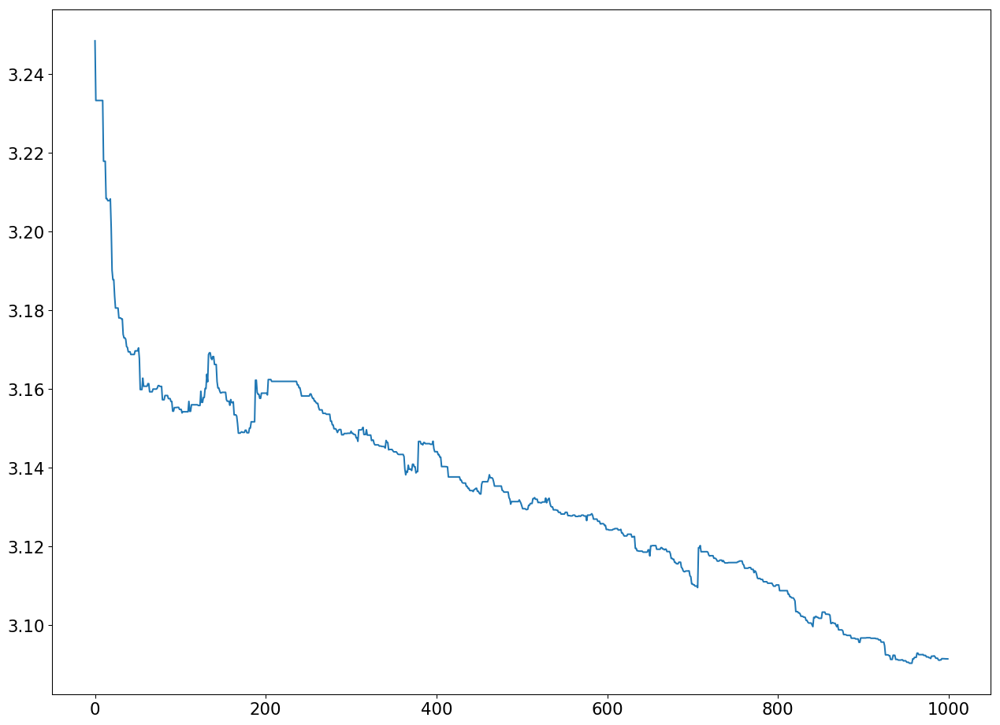

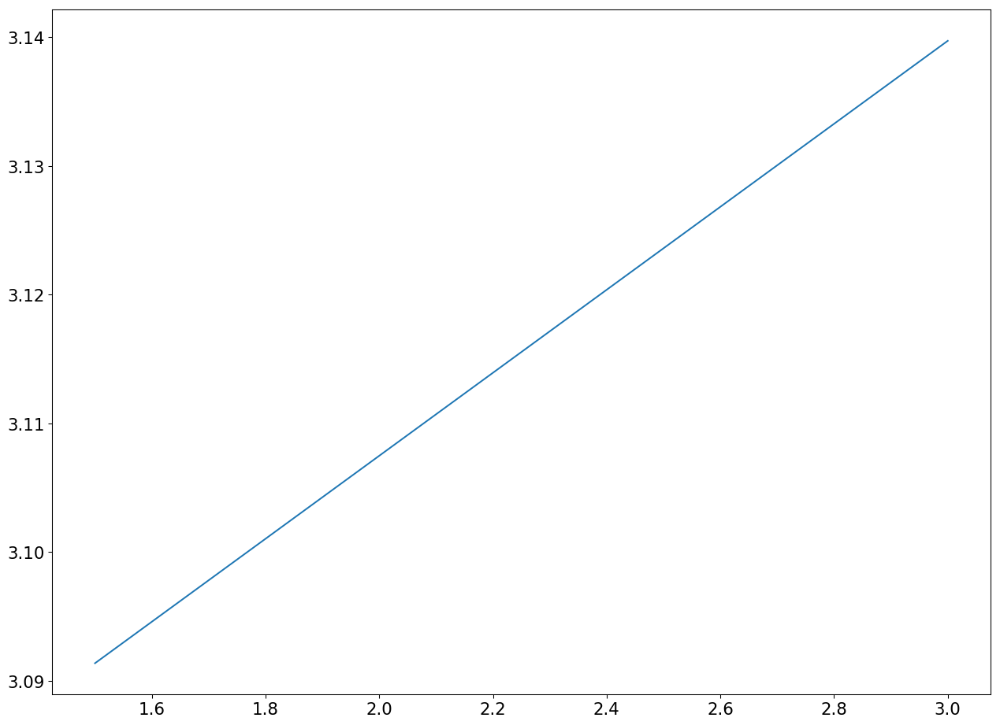

In [9]:
sizes3 = [6]

somlist3 = []
errlist3 = []
erriter3 = []
sigmalist = [6/2, 6/4]

epochs = 1000

[plt.plot(k) for k in Data]

for sigmai in sigmalist:
    
    somsizex = sizes3[0]
    somsizey = sizes3[0]
        
    som = MiniSom(somsizex, somsizey, 20, sigma=sigmai, learning_rate=0.05) # initialization of SOM
    
#    for i in range(0, epochs):
    som.train_random(Data, epochs) # trains the SOM with 1000 iterations
    
#    [plt.plot(som.winner(i)[0], som.winner(i)[1],'.') for i in Data]
    
    xyz = som.quantization(Data)
    
    abc = som.win_map(Data)
    
    err = som.quantization_error(Data)
    
    erriter3.append(som.err_evol)
    somlist3.append(som)
    errlist3.append(err)
    
    from pylab import rcParams
    rcParams['figure.figsize'] = 16, 12
    rcParams['figure.dpi'] = 96
    rcParams['font.size'] = 16
    
    fig, axs = plt.subplots(somsizex, somsizey, sharex=True, sharey=True)
    
    for i in range(somsizex):
        for j in range(somsizey):
            [axs[i, j].plot(k/np.linalg.norm(k)) for k in abc[i, j]]
#            [axs[i, j].plot(k) for k in abc[i, j]]
    #        axs[i][j].axis('off')
            axs[i, j].plot(som.get_weights()[i][j], 'k', linestyle='-.')
    plt.show()
    
#Plot the quantity of points associated with a neuron    
    x = np.zeros((somsizex, somsizey))

    for i in range(somsizex):
        for j in range(somsizey):
            x[i,j]=len(abc[i,j])
    
    fig, ax = plt.subplots()
    
    ax.matshow(x, cmap=plt.cm.Blues)
    
    for i in range(somsizex):
        for j in range(somsizey):
            c = int(x[j,i])
            ax.text(i, j, str(c), va='center', ha='center')
    plt.show()

    plt.plot(som.err_evol)

plt.figure()
plt.plot(sigmalist, errlist3)

Gaussian vs Mexican Hat

C:\Users\thiag\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


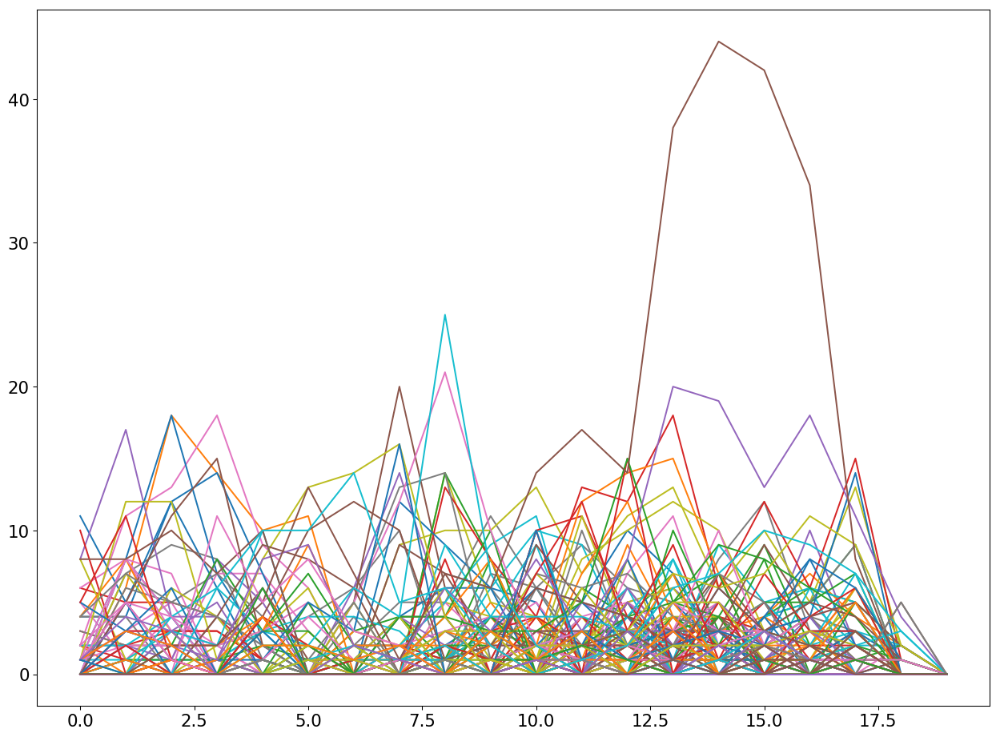

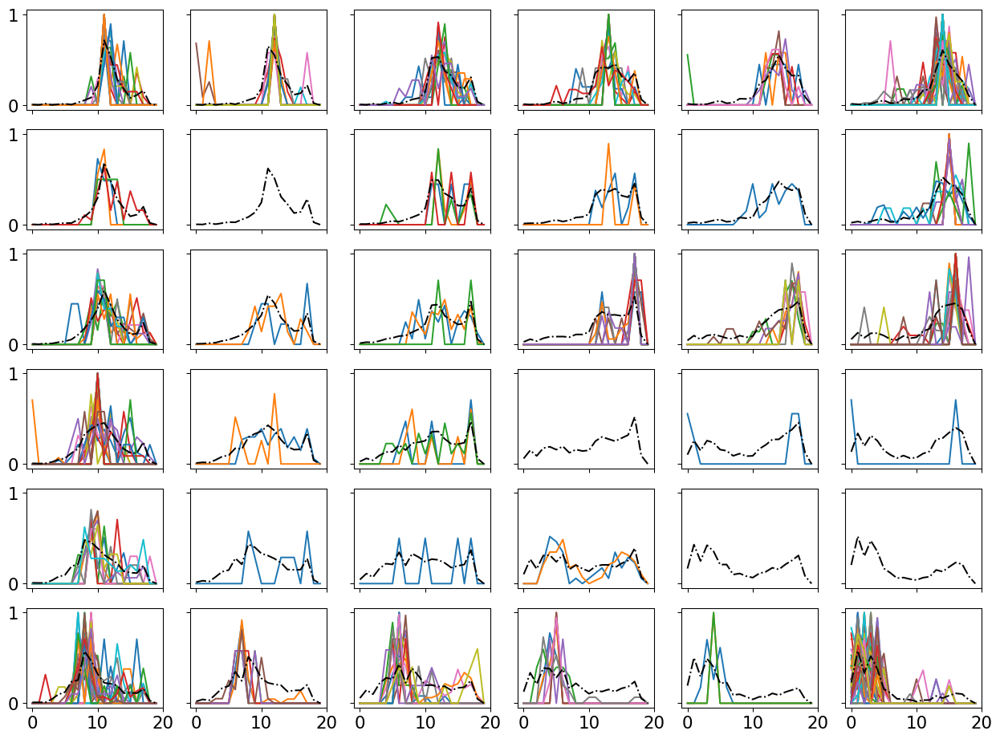

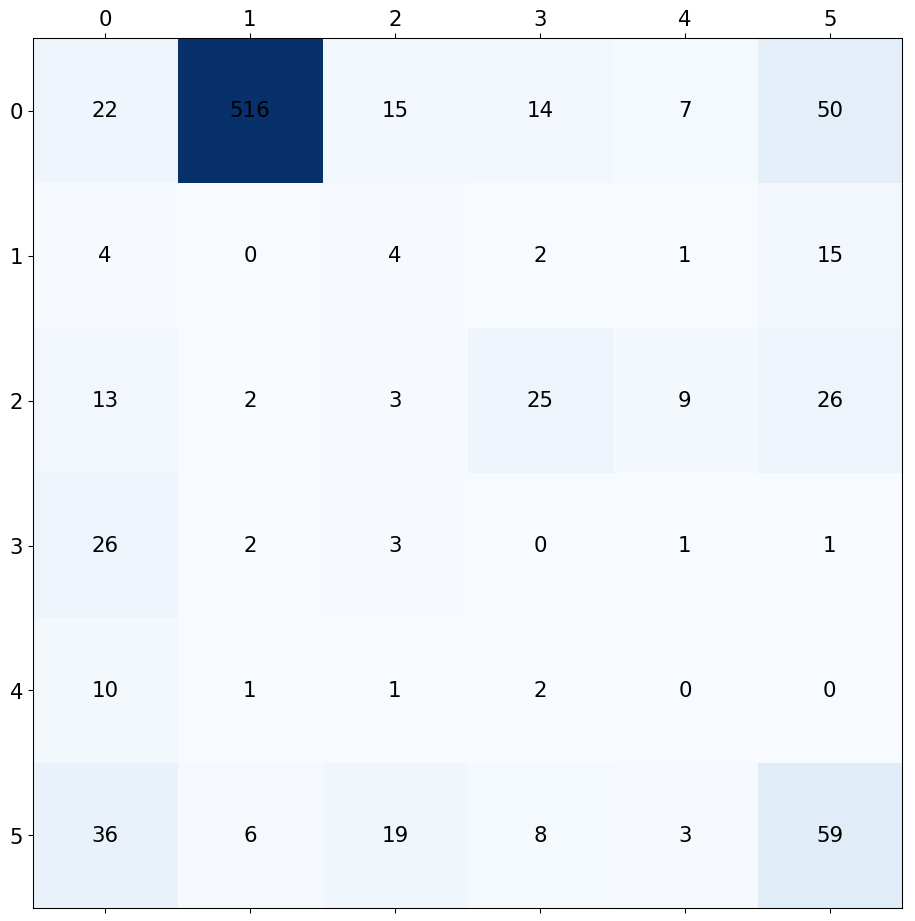

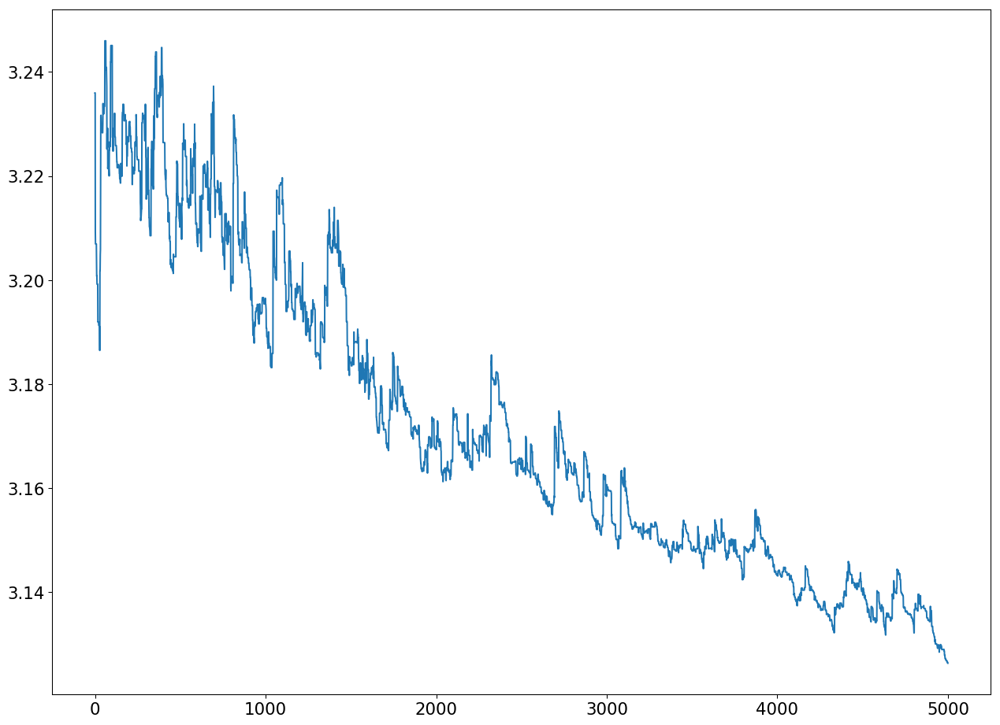

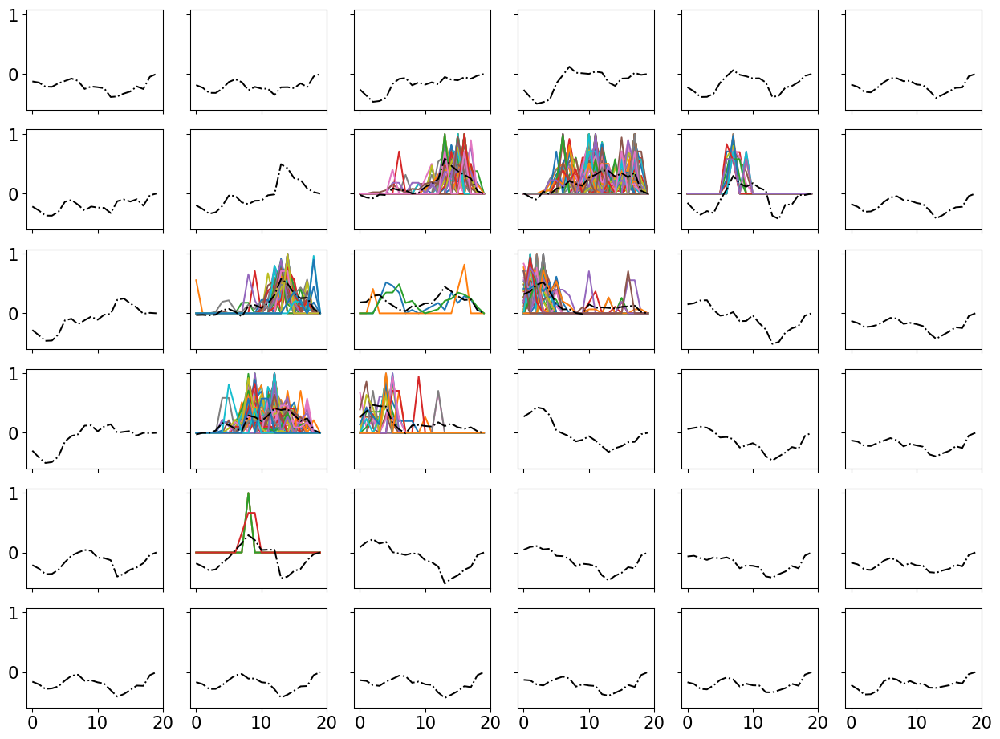

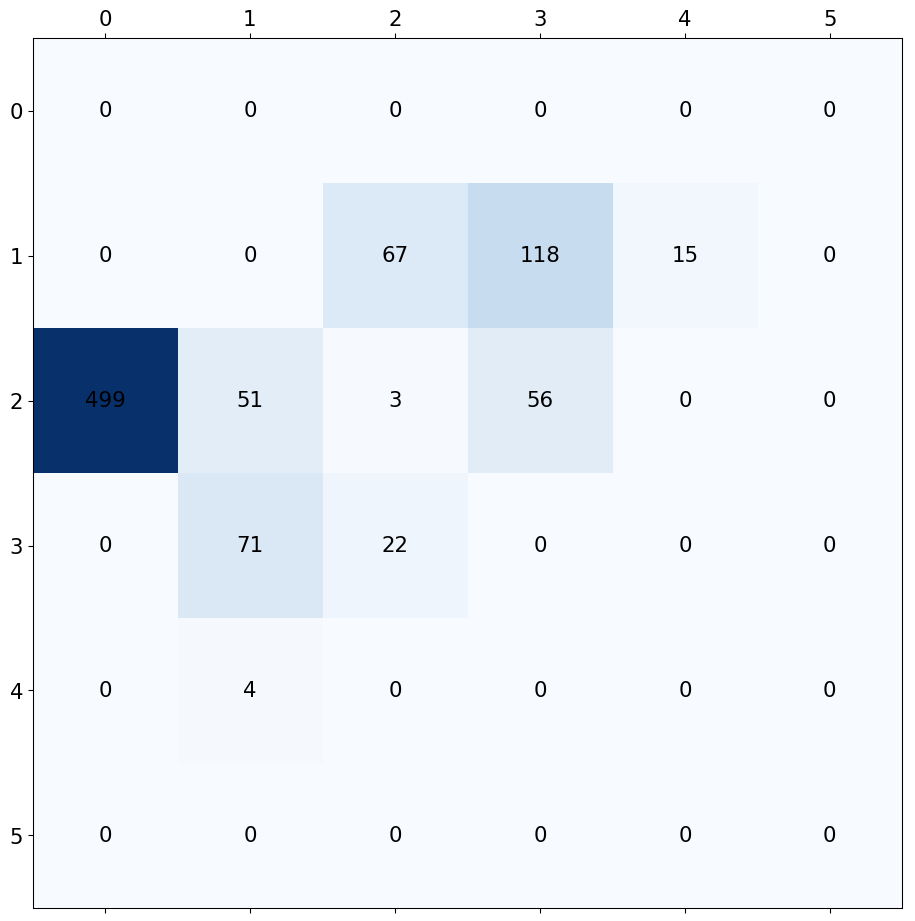

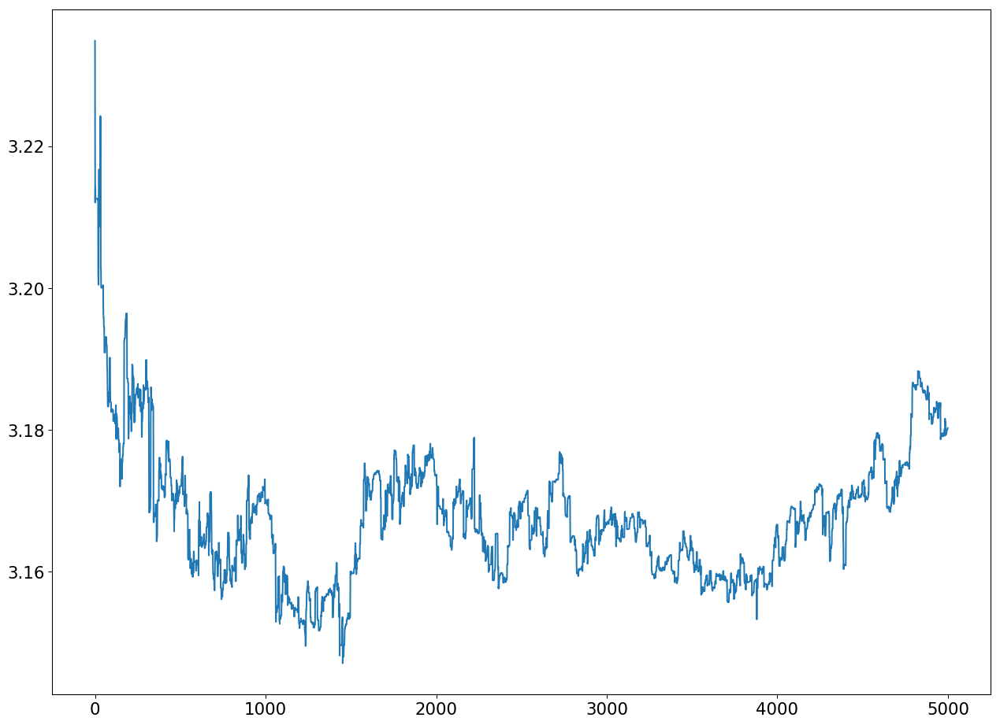

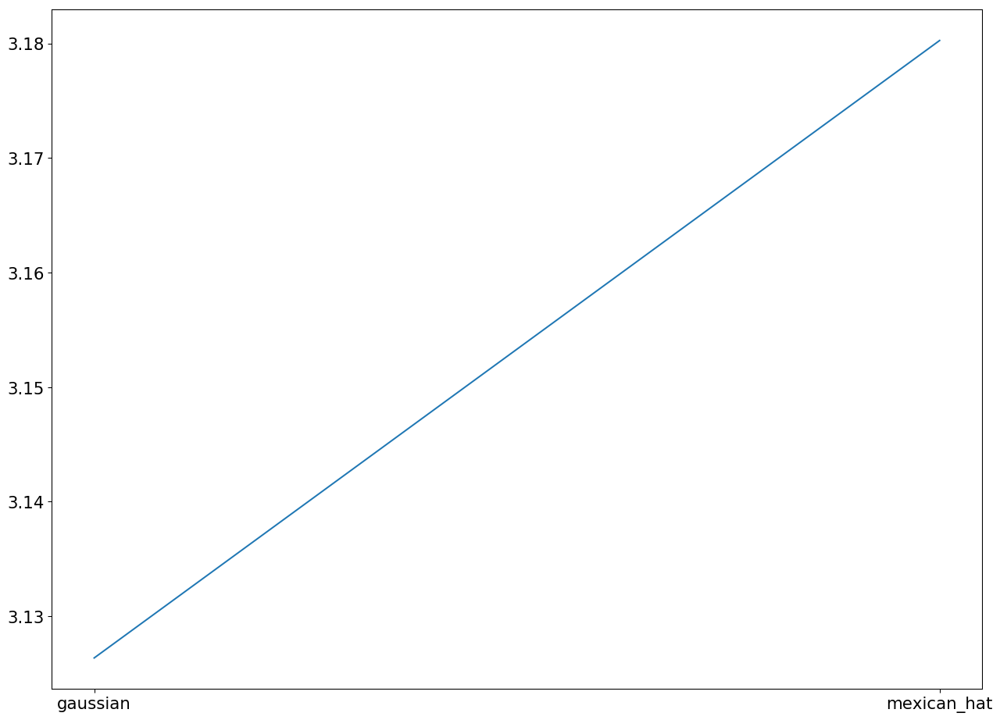

In [14]:
sizes4 = [6]

somlist4 = []
errlist4 = []
erriter4 = []

funcs = ['gaussian', 'mexican_hat']

epochs = 5000

[plt.plot(k) for k in Data]

for funci in funcs:
    
    somsizex = sizes4[0]
    somsizey = sizes4[0]
    
    sigmai= sizes4[0]/2.1
    
    som = MiniSom(somsizex, somsizey, 20, sigma=sigmai, learning_rate=0.05, neighborhood_function = funci) # initialization of SOM
    
#    for i in range(0, epochs):
    som.train_random(Data, epochs) # trains the SOM with 1000 iterations
    
#    [plt.plot(som.winner(i)[0], som.winner(i)[1],'.') for i in Data]
    
    xyz = som.quantization(Data)
    
    abc = som.win_map(Data)
    
    err = som.quantization_error(Data)
    
    erriter4.append(som.err_evol)
    somlist4.append(som)
    errlist4.append(err)
    
    from pylab import rcParams
    rcParams['figure.figsize'] = 16, 12
    rcParams['figure.dpi'] = 96
    rcParams['font.size'] = 16
    
    fig, axs = plt.subplots(somsizex, somsizey, sharex=True, sharey=True)
    
    for i in range(somsizex):
        for j in range(somsizey):
            [axs[i, j].plot(k/np.linalg.norm(k)) for k in abc[i, j]]
#            [axs[i, j].plot(k) for k in abc[i, j]]
    #        axs[i][j].axis('off')
            axs[i, j].plot(som.get_weights()[i][j], 'k', linestyle='-.')
    plt.show()
    
#Plot the quantity of points associated with a neuron    
    x = np.zeros((somsizex, somsizey))

    for i in range(somsizex):
        for j in range(somsizey):
            x[i,j]=len(abc[i,j])
    
    fig, ax = plt.subplots()
    
    ax.matshow(x, cmap=plt.cm.Blues)
    
    for i in range(somsizex):
        for j in range(somsizey):
            c = int(x[j,i])
            ax.text(i, j, str(c), va='center', ha='center')
    plt.show()

    plt.plot(som.err_evol)

plt.figure()
plt.xticks([0, 1], funcs)
plt.plot([0, 1], errlist4)
plt.show()

Run without the zeros

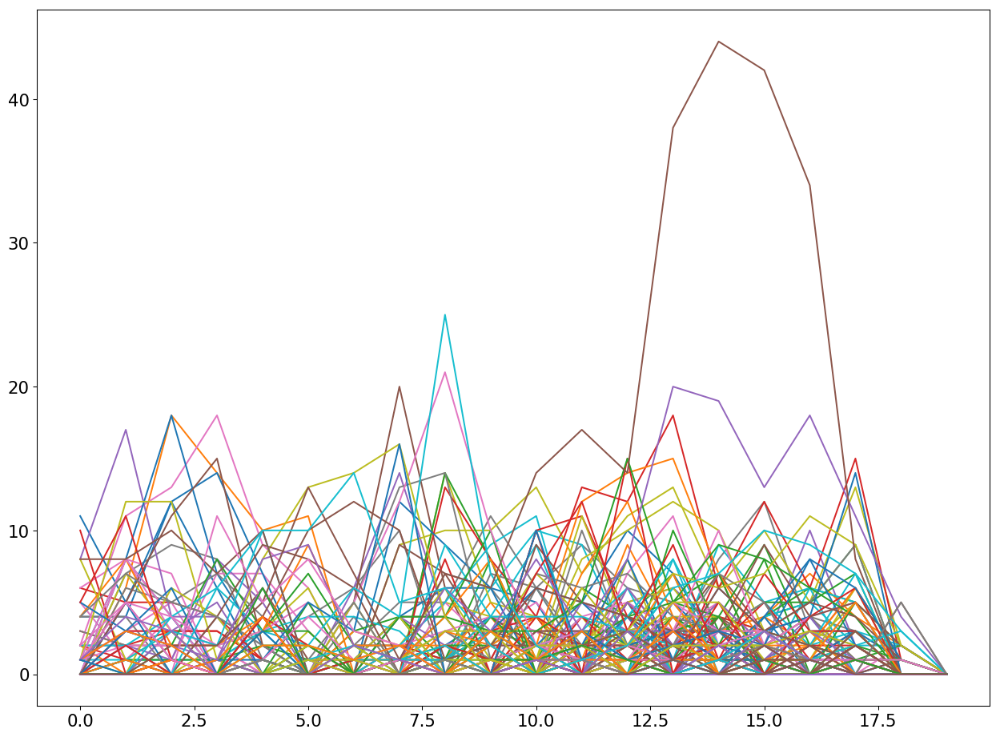

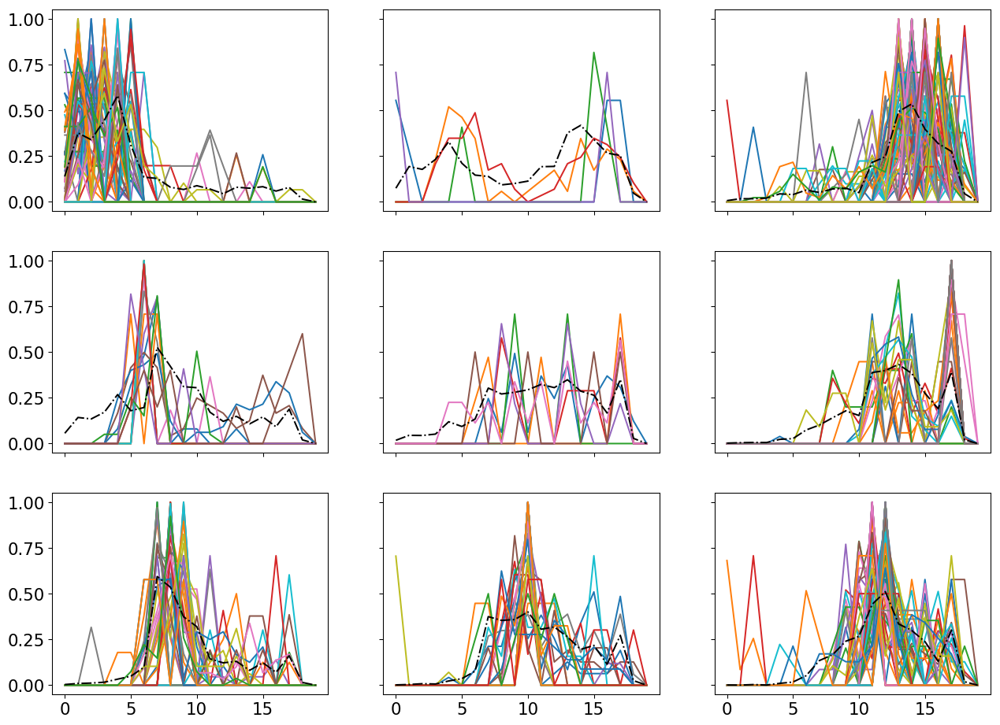

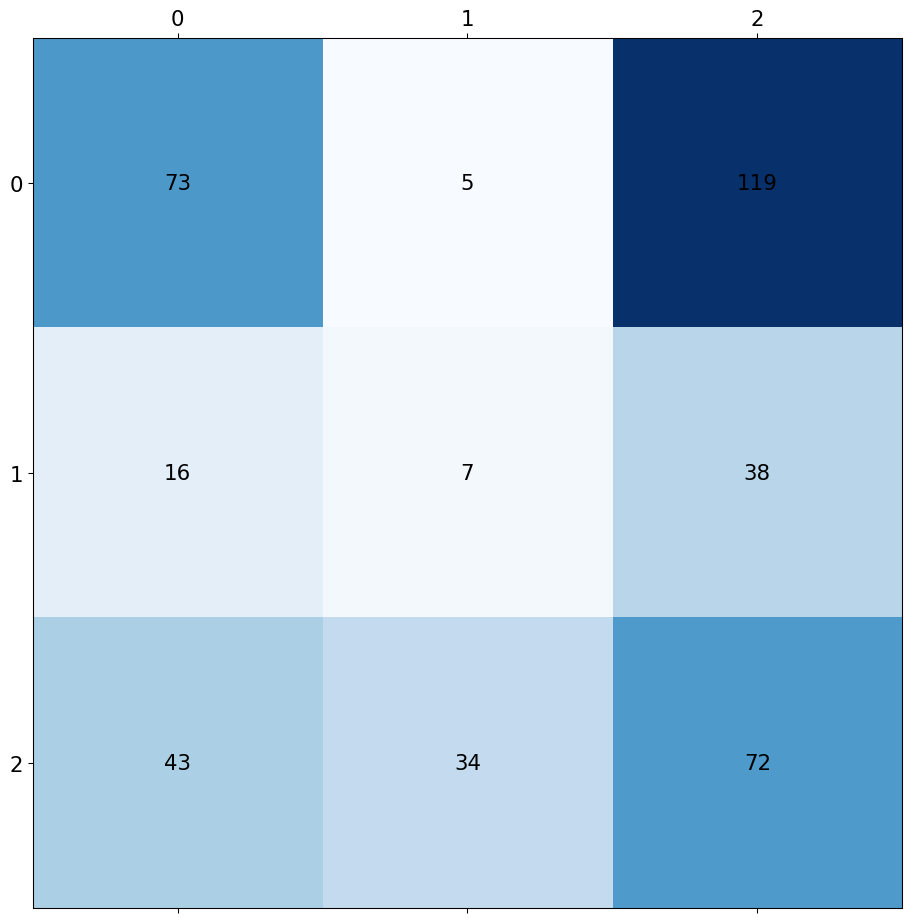

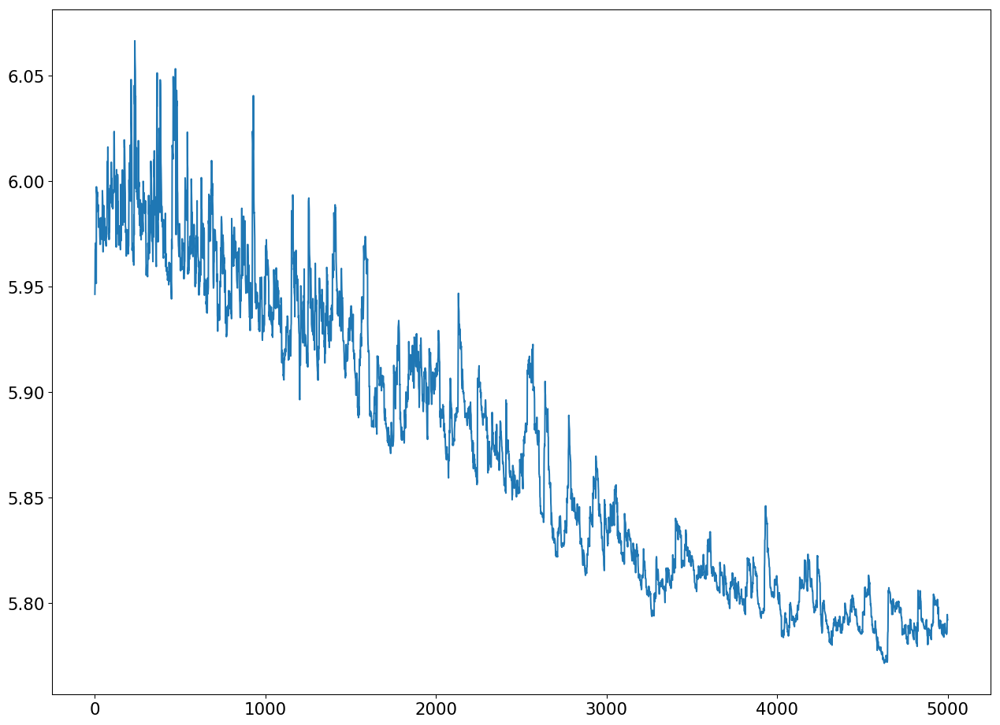

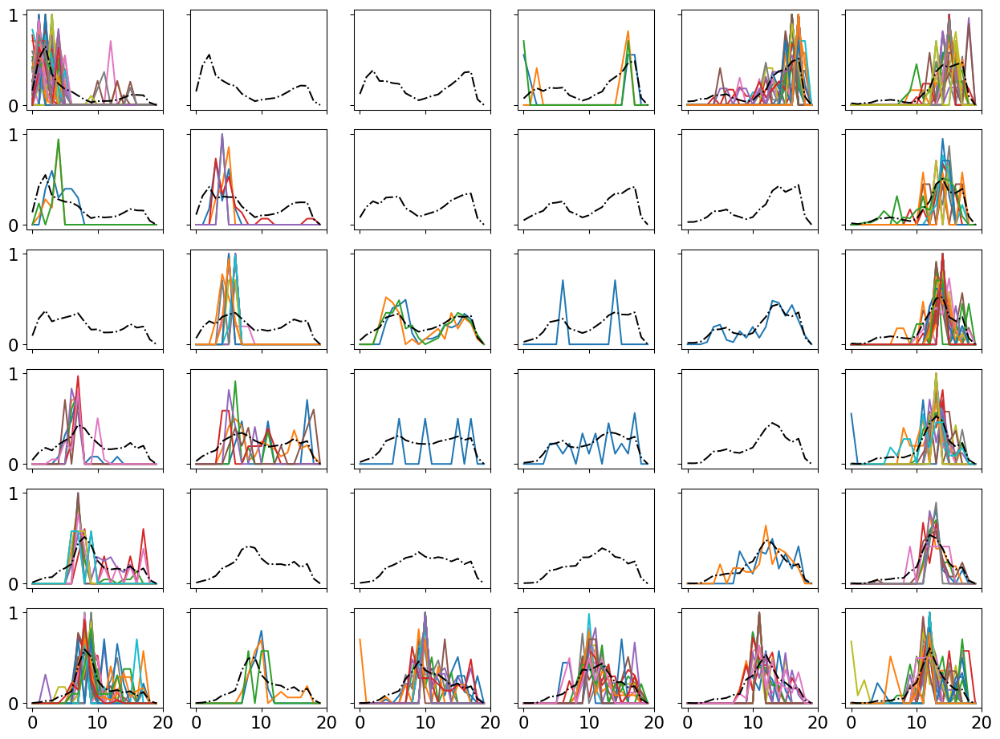

...

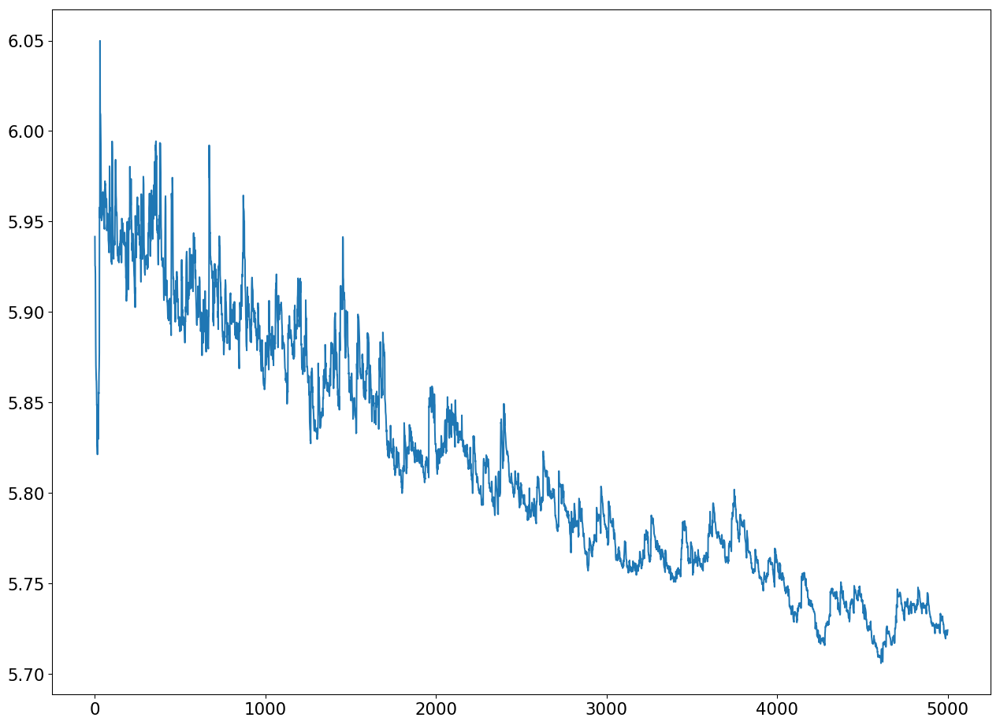

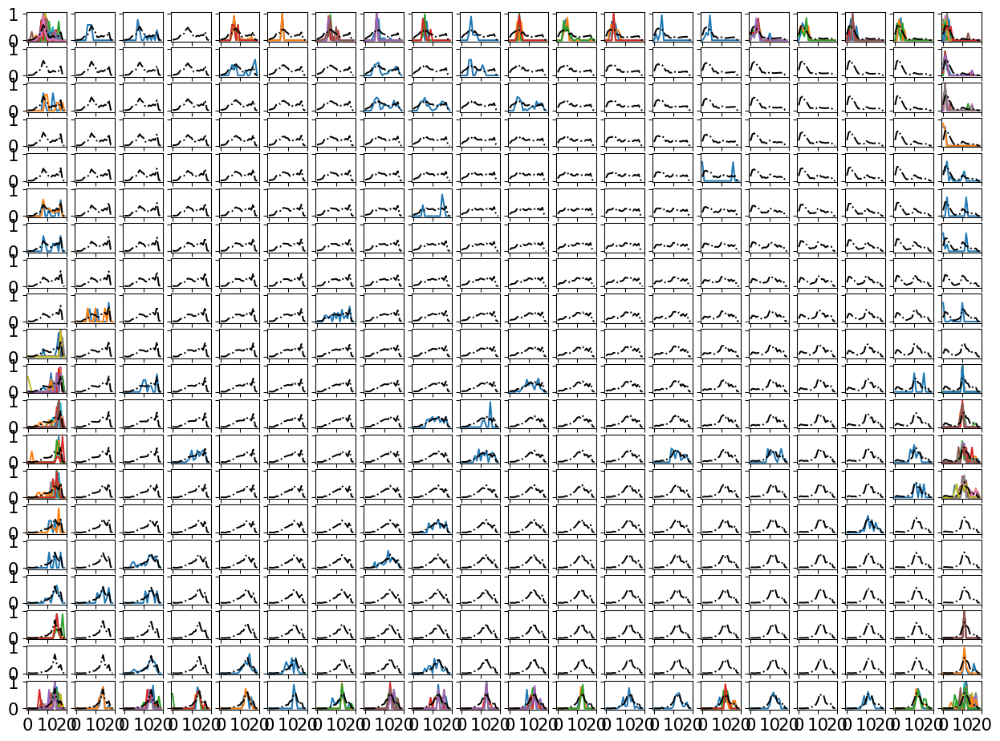

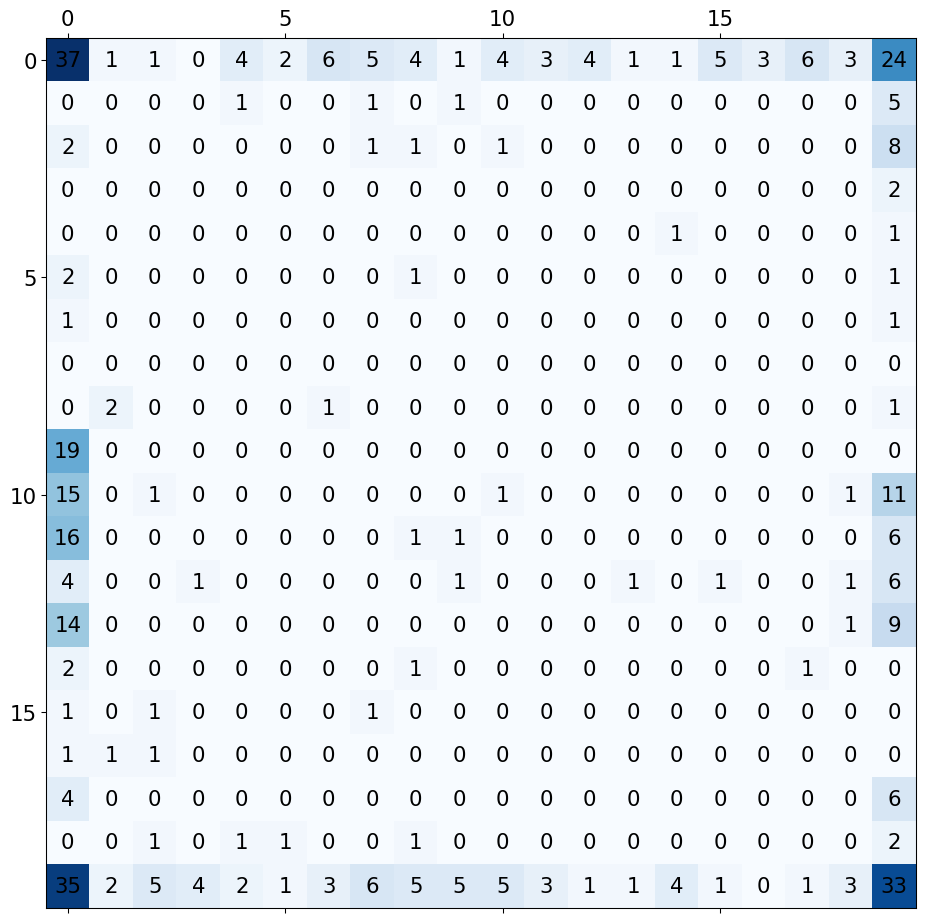

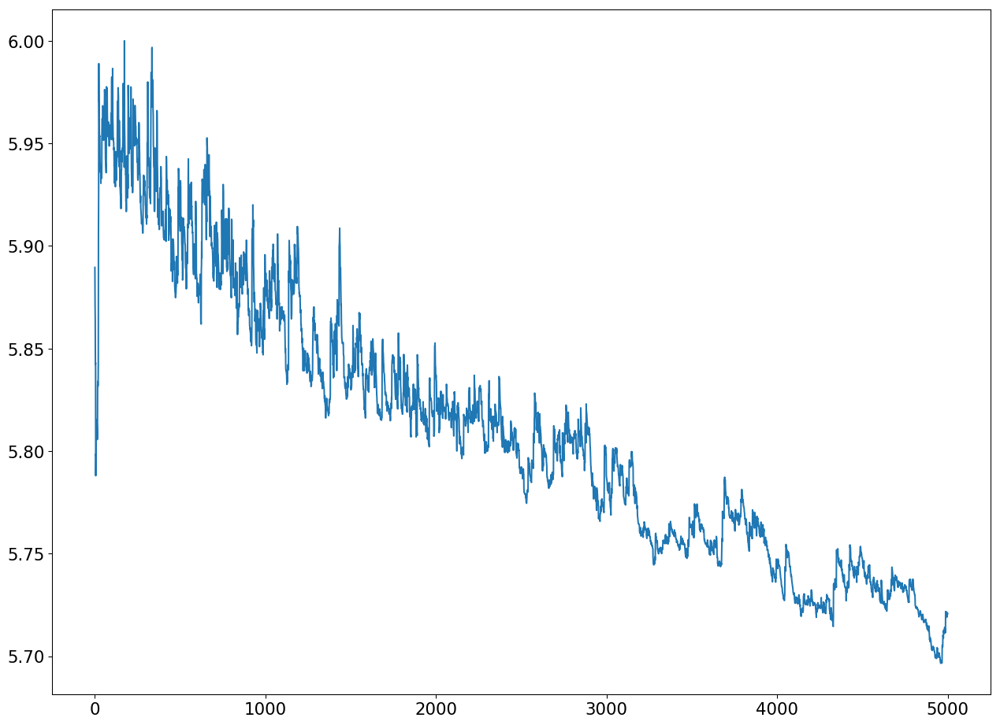

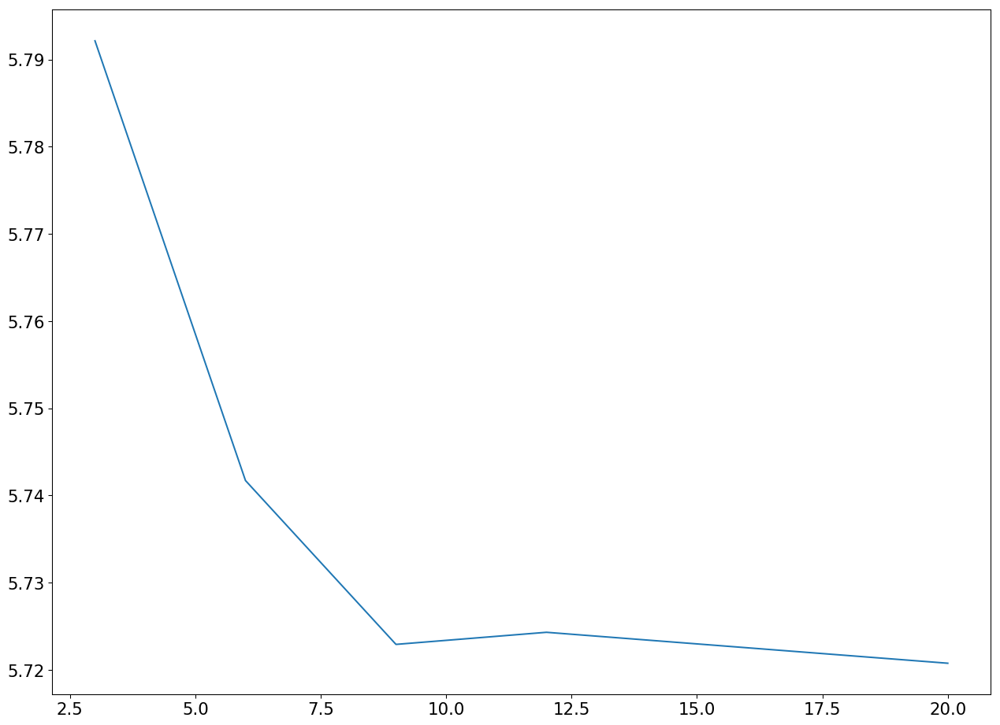

In [15]:
Data2 = [i for i in Data if i.tolist() != np.zeros(20).tolist()]

Data2 = np.array(Data2, dtype=float)

sizes = [3, 6, 9, 12, 20]

somlist5 = []
errlist5 = []
erriter5 = []

epochs = 5000

[plt.plot(k) for k in Data]

for sizei in sizes:
    
    somsizex = sizei
    somsizey = sizei
    
    sigmai= sizei/2.1
    
    som = MiniSom(somsizex, somsizey, 20, sigma=sigmai, learning_rate=0.05) # initialization of SOM
    
#    for i in range(0, epochs):
    som.train_random(Data2, epochs) # trains the SOM with 1000 iterations
    
#    [plt.plot(som.winner(i)[0], som.winner(i)[1],'.') for i in Data]
    
    xyz = som.quantization(Data2)
    
    abc = som.win_map(Data2)
    
    err = som.quantization_error(Data2)
    
    erriter5.append(som.err_evol)
    somlist5.append(som)
    errlist5.append(err)
    
    from pylab import rcParams
    rcParams['figure.figsize'] = 16, 12
    rcParams['figure.dpi'] = 96
    rcParams['font.size'] = 16
    
    fig, axs = plt.subplots(somsizex, somsizey, sharex=True, sharey=True)
    
    for i in range(somsizex):
        for j in range(somsizey):
            [axs[i, j].plot(k/np.linalg.norm(k)) for k in abc[i, j]]
#            [axs[i, j].plot(k) for k in abc[i, j]]
    #        axs[i][j].axis('off')
            axs[i, j].plot(som.get_weights()[i][j], 'k', linestyle='-.')
    plt.show()

#Plot the quantity of points associated with a neuron    
    x = np.zeros((somsizex, somsizey))

    for i in range(somsizex):
        for j in range(somsizey):
            x[i,j]=len(abc[i,j])
    
    fig, ax = plt.subplots()
    
    ax.matshow(x, cmap=plt.cm.Blues)
    
    for i in range(somsizex):
        for j in range(somsizey):
            c = int(x[j,i])
            ax.text(i, j, str(c), va='center', ha='center')
    plt.show()
    
    plt.plot(som.err_evol)

plt.figure()
plt.plot(sizes, errlist5)

In [17]:
errlist5

[5.792148282956027,
 5.74170542163833,
 5.722909320388611,
 5.7242960295580865,
 5.720747106129075]

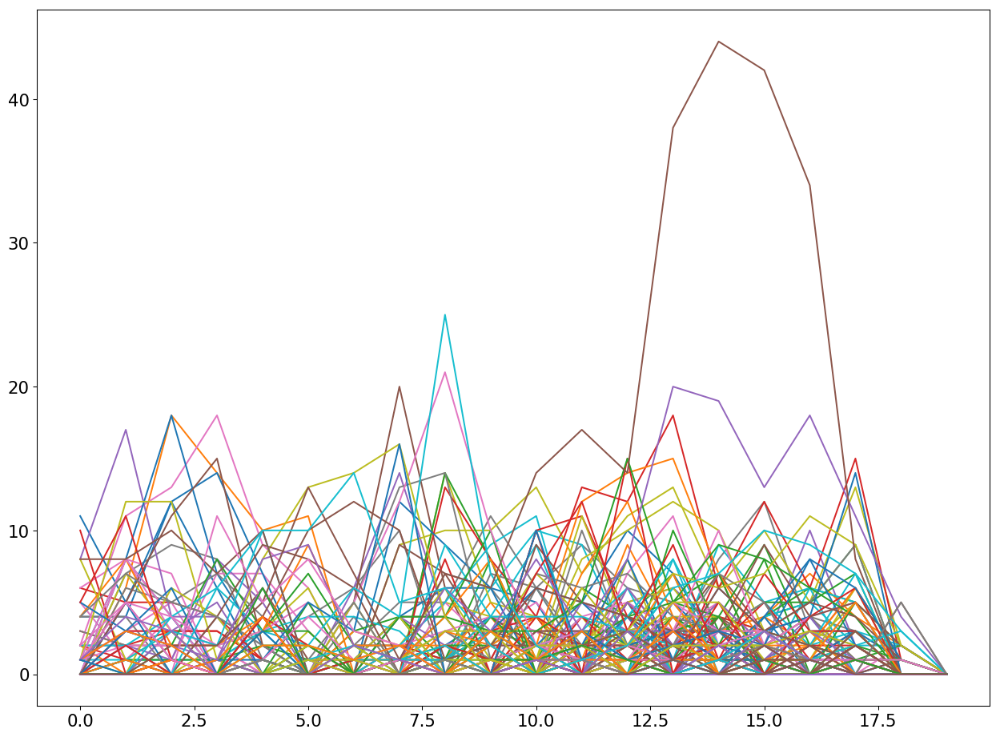

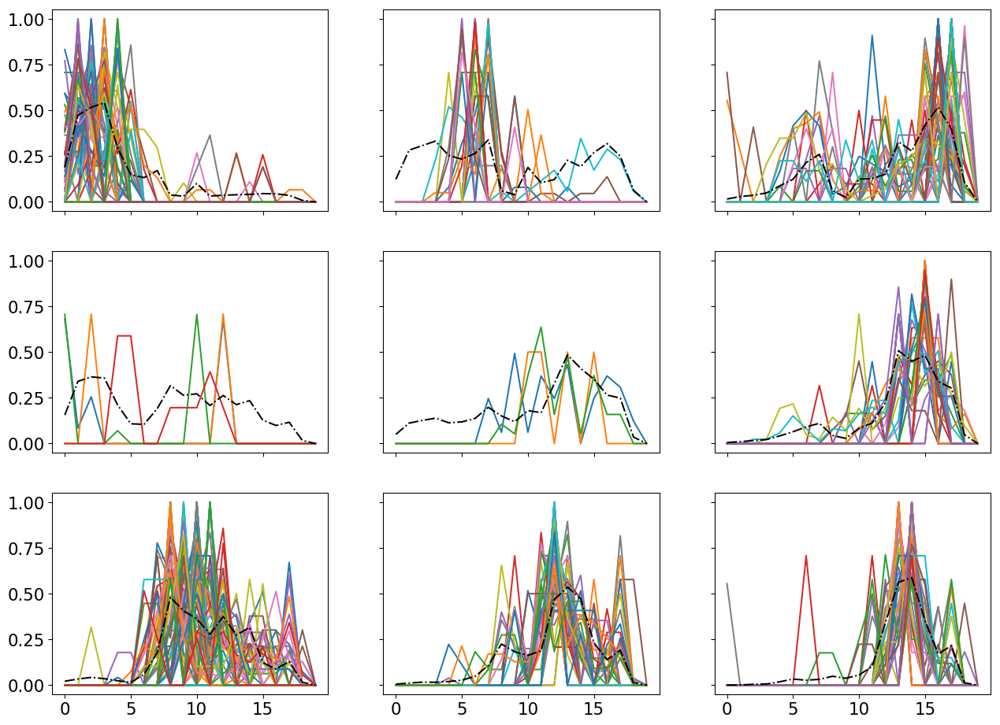

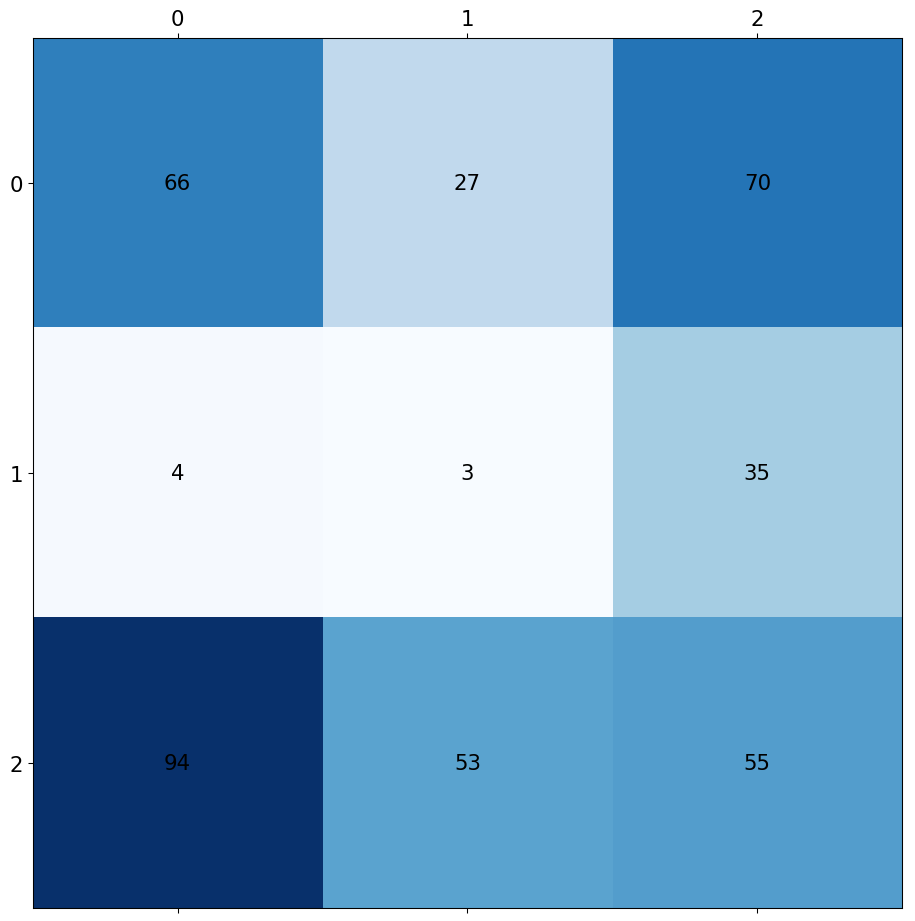

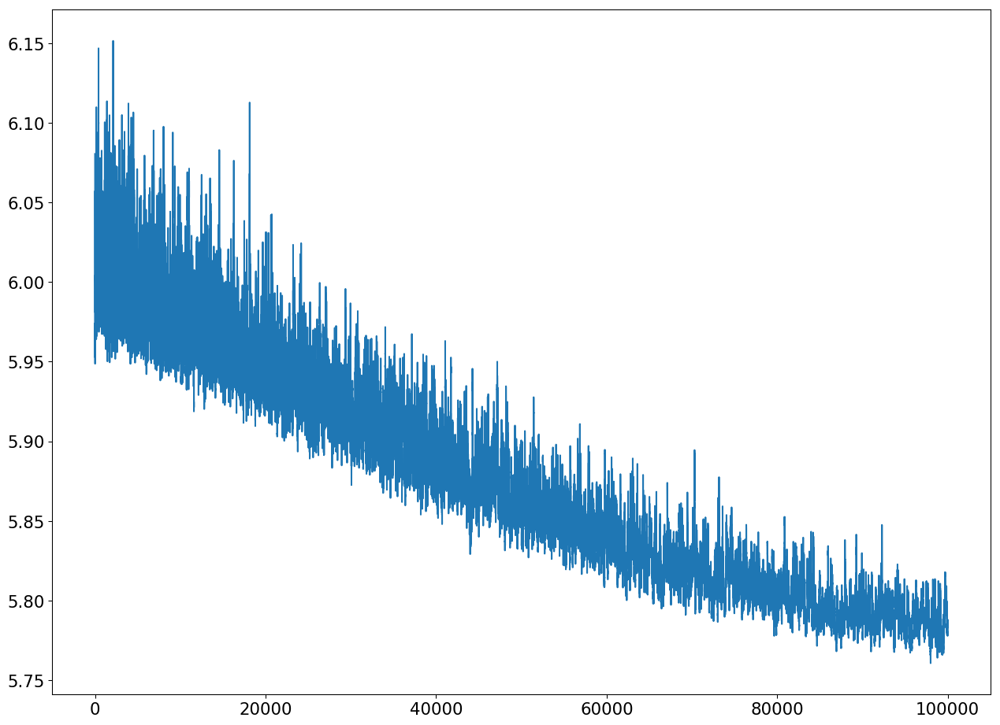

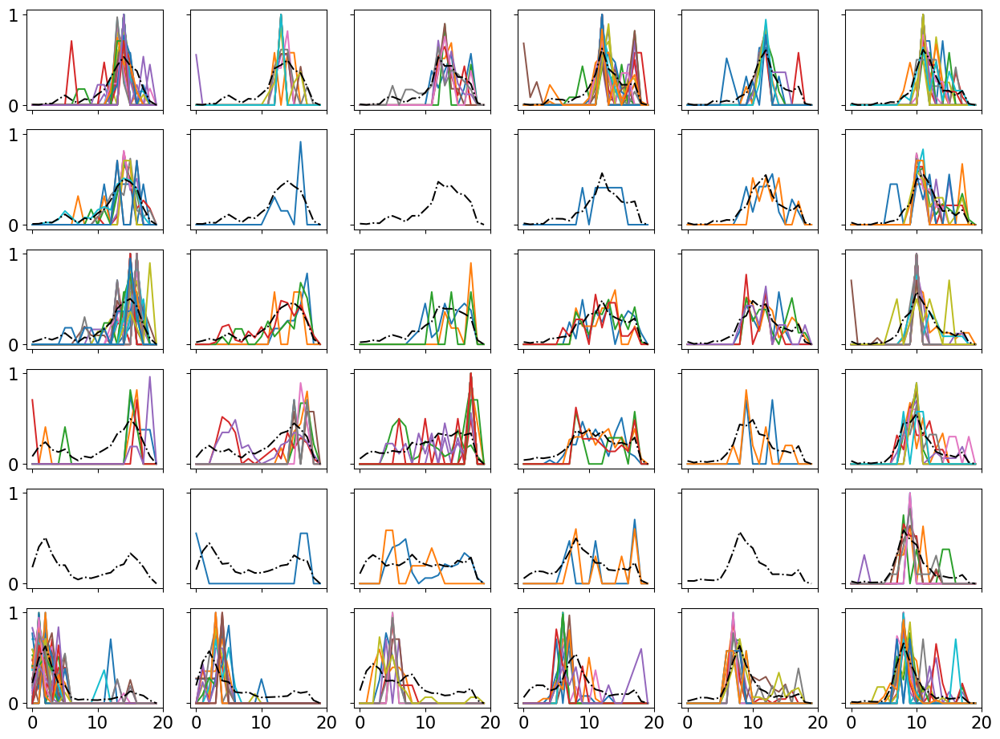

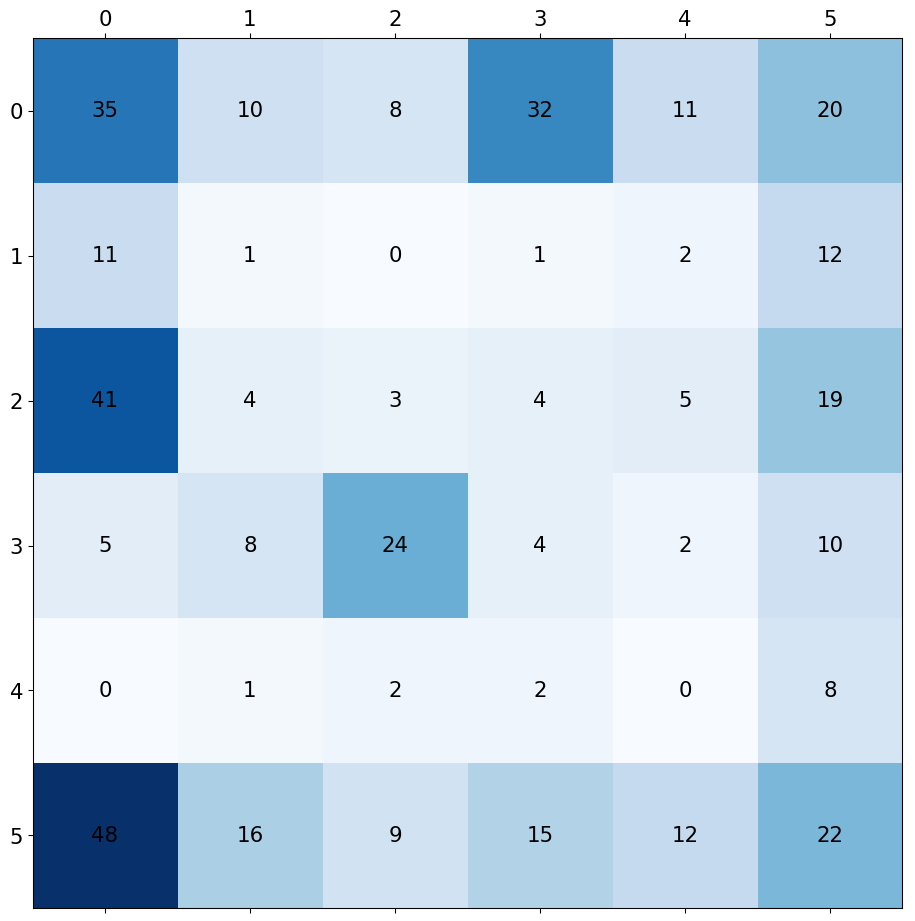

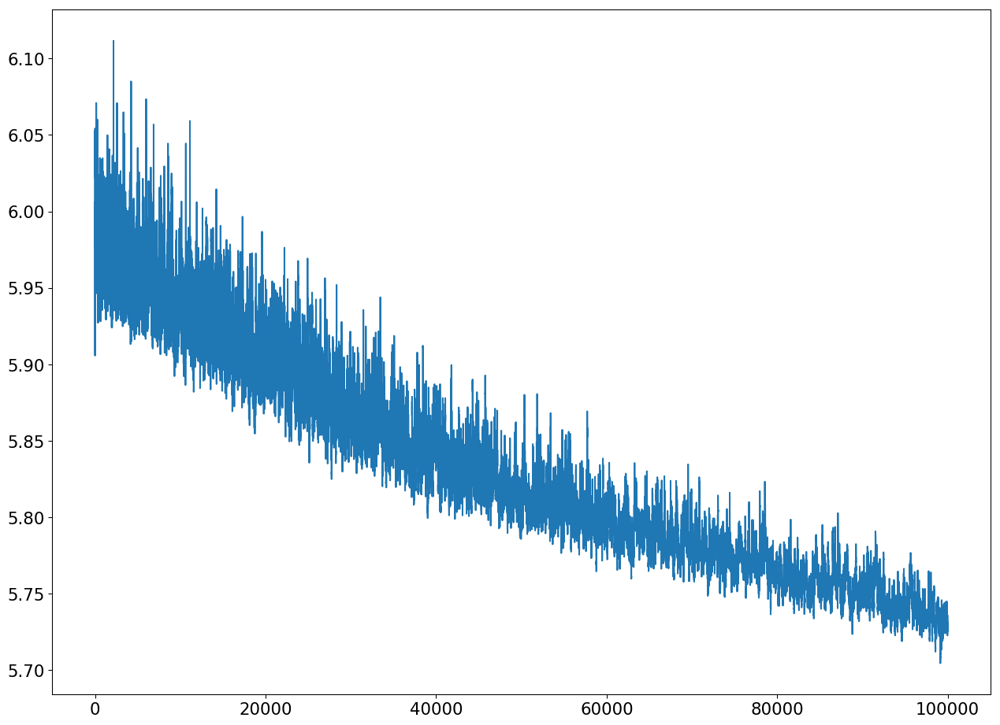

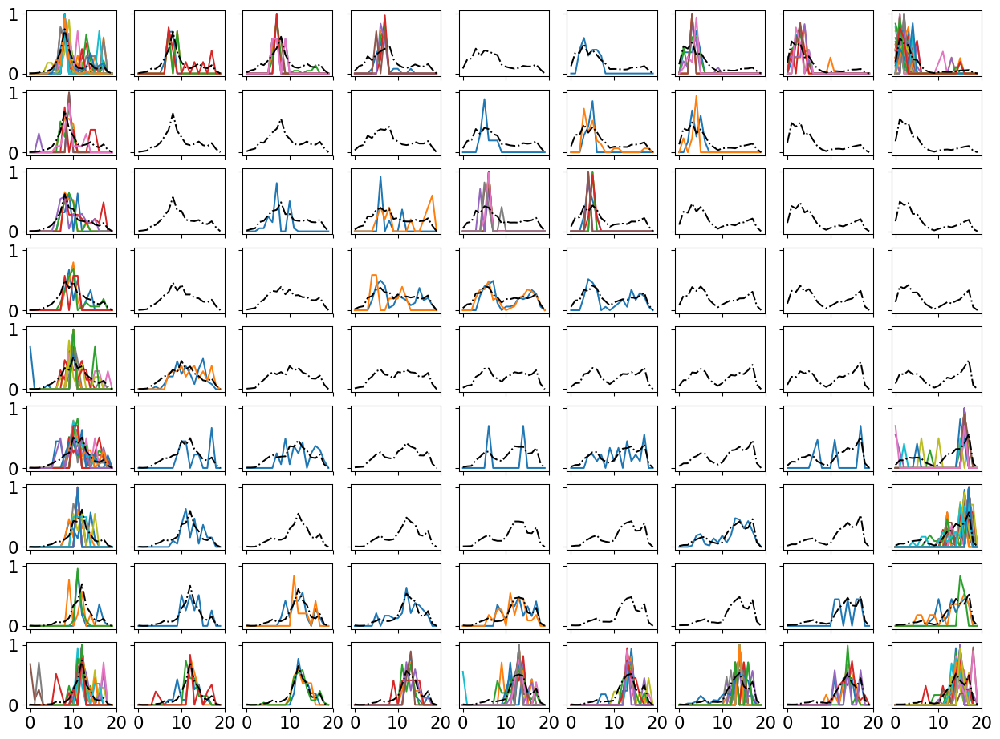

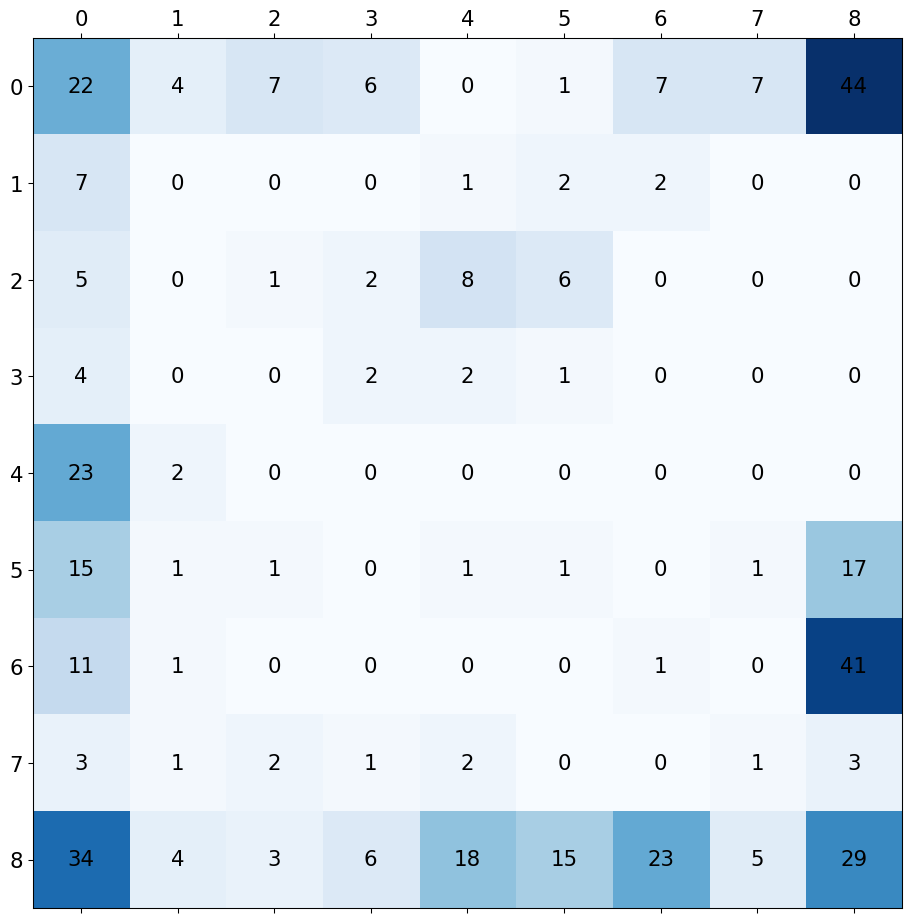

KeyboardInterrupt: 

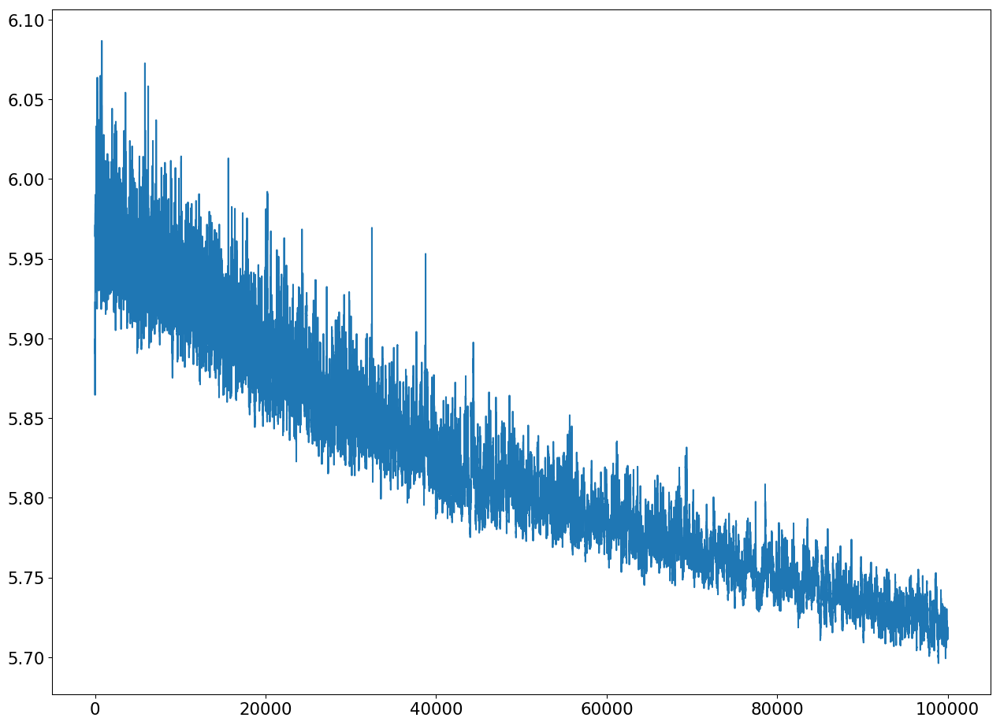

In [19]:
Data2 = [i for i in Data if i.tolist() != np.zeros(20).tolist()]

Data2 = np.array(Data2, dtype=float)

sizes = [3, 6, 9, 12, 20]

somlist6 = []
errlist6 = []
erriter6 = []

epochs = 100000

[plt.plot(k) for k in Data]

for sizei in sizes:
    
    somsizex = sizei
    somsizey = sizei
    
    sigmai= sizei/2.1
    
    som = MiniSom(somsizex, somsizey, 20, sigma=sigmai, learning_rate=0.05) # initialization of SOM
    
#    for i in range(0, epochs):
    som.train_random(Data2, epochs) # trains the SOM with 1000 iterations
    
#    [plt.plot(som.winner(i)[0], som.winner(i)[1],'.') for i in Data]
    
    xyz = som.quantization(Data2)
    
    abc = som.win_map(Data2)
    
    err = som.quantization_error(Data2)
    
    erriter6.append(som.err_evol)
    somlist6.append(som)
    errlist6.append(err)
    
    from pylab import rcParams
    rcParams['figure.figsize'] = 16, 12
    rcParams['figure.dpi'] = 96
    rcParams['font.size'] = 16
    
    fig, axs = plt.subplots(somsizex, somsizey, sharex=True, sharey=True)
    
    for i in range(somsizex):
        for j in range(somsizey):
            [axs[i, j].plot(k/np.linalg.norm(k)) for k in abc[i, j]]
#            [axs[i, j].plot(k) for k in abc[i, j]]
    #        axs[i][j].axis('off')
            axs[i, j].plot(som.get_weights()[i][j], 'k', linestyle='-.')
    plt.show()

#Plot the quantity of points associated with a neuron    
    x = np.zeros((somsizex, somsizey))

    for i in range(somsizex):
        for j in range(somsizey):
            x[i,j]=len(abc[i,j])
    
    fig, ax = plt.subplots()
    
    ax.matshow(x, cmap=plt.cm.Blues)
    
    for i in range(somsizex):
        for j in range(somsizey):
            c = int(x[j,i])
            ax.text(i, j, str(c), va='center', ha='center')
    plt.show()
    
    plt.plot(som.err_evol)

plt.figure()
plt.plot(sizes, errlist6)

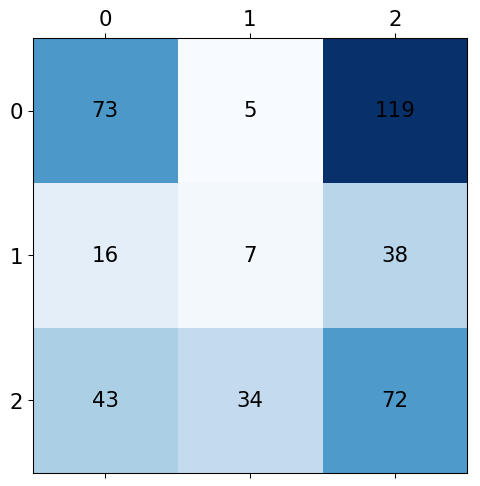

In [29]:
abc = somlist5[0].win_map(Data2)

x = np.zeros((3, 3))

for i in range(3):
    for j in range(3):
        x[i,j]=len(abc[i,j])
        
from pylab import rcParams
rcParams['figure.figsize'] = 8, 6
rcParams['figure.dpi'] = 96
rcParams['font.size'] = 16

fig, ax = plt.subplots()
    
ax.matshow(x, cmap=plt.cm.Blues)
    
for i in range(3):
    for j in range(3):
        c = int(x[j,i])
        ax.text(i, j, str(c), va='center', ha='center')
plt.show()

NameError: name 'plt' is not defined